# Bayesian analysis of pulse train data

### Acoustic emission of gas bubbles in liquid

In [1045]:
from matplotlib import pyplot as plt

In [1046]:
import numpy as np
from joblib import Parallel, delayed
from itertools import product

class pulse:
    
    def __init__(self, y, t):

        self.N = len(y)

        self.y = y
        self.t = t
        self.s_y2 = y.dot(y)

        self.t_min = t[3]
        self.t_max = t[-3]

    def __w(self, delta, t0):
        v = np.exp(-delta*(self.t-t0))
        v[np.where(self.t < t0)] = 0
        return v
        
    def __phi(self, omega):
        return np.cos(2*np.pi*omega*self.t)
    
    def __psi(self, omega):
        return np.sin(2*np.pi*omega*self.t)
        
    def llhood(self, omega, delta, t0):

        w = self.__w(delta, t0)
        phi = self.__phi(omega)
        psi = self.__psi(omega)
        
        d = w*phi
        e = w*psi
        
        sum_d2 = d.dot(d)
        sum_e2 = e.dot(e)
        sum_yd = self.y.dot(d)
        sum_ye = self.y.dot(e)
        
        
        Z0 = np.log(d.dot(d)) + np.log(e.dot(e))
        
        Z = self.s_y2 - ((sum_yd**2)/sum_d2 + (sum_ye**2)/sum_e2)
        if Z > 0:
            ll = 0.5*Z0 - ((self.N+1)/2)*np.log(Z)
            #ll =  - ((self.N+1)/2)*np.log(Z)
        else:
            print("Z = {}".format(Z))
            ll = -np.infty

        return ll
    
    def get_llhood_t(self, omega, delta, npoints = 100):
        
        _t = np.linspace(self.t_min, self.t_max, npoints)
        
        L = np.zeros(npoints)
        
        from joblib import Parallel, delayed        
        
        #lL = Parallel(n_jobs = -1)(delayed(self.llhood)(omega, delta, t) for t in _t)
        #L = np.array(lL)
        for i in range(npoints):
            L[i] = self.llhood(omega, delta, _t[i])
            
        return _t, L

    def _M(self, omega, l, n_grid_t):
        _, p = self.get_llhood_t(omega, l, n_grid_t)

        mp = np.max(p)
        Z = (np.sum(np.exp(p - mp))) + mp

        return Z

    

def pulsogram(obj, omega_min, omega_max, n_omega, delta_min, delta_max, n_delta, n_grid_t = 100):

    linomega = np.linspace(omega_min, omega_max, n_omega)
    lindelta = np.linspace(delta_min, delta_max, n_delta)

    from joblib import Parallel, delayed
    from itertools import product

    lM = Parallel(n_jobs=-1)(delayed(obj._M)(ol[0],ol[1], n_grid_t) for ol in product(linomega, lindelta))
    M = np.array(lM)
    M = np.reshape(M, [n_omega, n_delta])    

    return M, linomega, lindelta


class abubble:
    
    def __init__(self, y, t):

        # Parameters based on water at 20 degrees Celsius
        self.N = len(y)

        self.y = y
        self.t = t
        self.s_y2 = y.dot(y)

        self.t_min = t[3]
        self.t_max = t[-15]
        
        # Specific heat
        self.__gamma = 1.4
        
        # Density
        self.__rho = 998
        
        # Atmospheric pressure
        self.__p = 101325        
        
        # Vapour pressure
        self.__pv = 2.3

        # Surface tension
        self.__tau = 72.87

        # Shear viscosity
        self.__eta = 1.0016       
        
        # Thermodynamic constant
        self.__kappa = self.__gamma      
        
        # Number of harmonics
        self.__nharm = 1
        
        # Static pressure
        depth = .22
        self.__P0 = 9.8 * self.__rho * depth

    def __w(self, delta, t0):
        v = np.exp(-delta*(self.t-t0))
        v[np.where(self.t < t0)] = 0
        return v
    
    def w(self, delta, t0):
        return self.__w(delta, t0)
        
    def __phi(self, omega):
        phi = np.zeros(self.N)
        for i in range(self.__nharm):
            phi = phi + np.cos(2*np.pi*(i+1)*omega*self.t)
        return phi
    
    def phi(self, omega):
        return self.__phi(omega)
    
    def __psi(self, omega):
        psi = np.zeros(self.N)
        for i in range(self.__nharm):
            psi = psi + np.sin(2*np.pi*(i+1)*omega*self.t)
        return psi
    
    def psi(self, omega):
        return self.__psi(omega)
        
    def __omega(self, r):
        #return (1/(r*np.sqrt(self.__rho)))*np.sqrt(3*self.__kappa*(self.__rho-self.__pv + 2*self.__tau/r) - 2*self.__tau/r + self.__pv - 4*self.__eta*self.__eta/(self.__rho*r*r))
        
        # Minnaert
        return np.sqrt((3*self.__gamma*self.__P0)/self.__rho)/(2*np.pi*r)
        
    def omega(self, r):
        return self.__omega(r)    
    
    def __delta(self, r):
        f0 = self.__omega(r)
        return np.pi * (0.014 + (1.1 * 10**(-5))*f0) * f0
    
    def delta(self, r):
        return self.__delta(r)

    
    def llhood(self, r, t0):

        # Frequency
        omega = self.__omega(r)
        
        # Dumping
        delta = self.__delta(r)
        
        w = self.__w(delta, t0)
        phi = self.__phi(omega)
        psi = self.__psi(omega)
        
        d = w*phi
        e = w*psi
        
        sum_d2 = d.dot(d)
        sum_e2 = e.dot(e)
        sum_yd = self.y.dot(d)
        sum_ye = self.y.dot(e)
        
        
        Z0 = np.log(d.dot(d)) + np.log(e.dot(e))
        
        Z = self.s_y2 - ((sum_yd**2)/sum_d2 + (sum_ye**2)/sum_e2)
        if Z > 0:
            ll = -0.5 * Z0 - ((self.N+1)/2)*np.log(Z)
            #ll =  - ((self.N+1)/2)*np.log(Z)
        else:
            print("Z = {}".format(Z))
            ll = -np.infty

        return ll
    
    def get_llhood_t(self, r, npoints = 100):
        
        _t = np.linspace(self.t_min, self.t_max, npoints)
        
        L = np.zeros(npoints)
        for i in range(npoints):
            L[i] = self.llhood(r, _t[i])
            
        return _t, L
    
    def _M(self, r, n_grid_t):
        _, p = self.get_llhood_t(r, n_grid_t)

        return p

    

def bubblegram(obj, r_min, r_max, n_r, n_grid_t = 100):

    linr = np.linspace(r_min, r_max, n_r)

    from joblib import Parallel, delayed
    from itertools import product

    lM = Parallel(n_jobs=-1)(delayed(obj._M)(ol, n_grid_t) for ol in linr)
    M = np.array(lM)
    M = np.reshape(M, [n_r, n_grid_t])    

    return M, linr

## Bayesian analysis of simulated pulse

Frequency and dumping factor independent

Comparing likelihood for different values of $\omega$ and $\delta$

In [12]:
%%time
o = pulse(y, t)
param1 = (omega, l)
param2 = (omega, 1)
param3 = (omega, 26)
t1, p1 = o.get_llhood_t(param1[0], param1[1], npoints = 100)
t2, p2 = o.get_llhood_t(param2[0], param2[1], npoints = 100)
t3, p3 = o.get_llhood_t(param3[0], param3[1], npoints = 100)

CPU times: user 76.1 ms, sys: 3.7 ms, total: 79.8 ms
Wall time: 79 ms


In [8]:
%%time
o = bgram.pulse(y, t)
param1 = (omega, l)
param2 = (omega, 1)
param3 = (omega, 26)
p1 = o.get_llhood_t(param1[0], param1[1], npoints = 100)
p2 = o.get_llhood_t(param2[0], param2[1], npoints = 100)
p3 = o.get_llhood_t(param3[0], param3[1], npoints = 100)

CPU times: user 293 ms, sys: 171 µs, total: 293 ms
Wall time: 293 ms


$ \sum e^{l_i} = e^{C} \sum e^{l_i}e^{-C} = e^{C} \sum e^{l_i-C}$

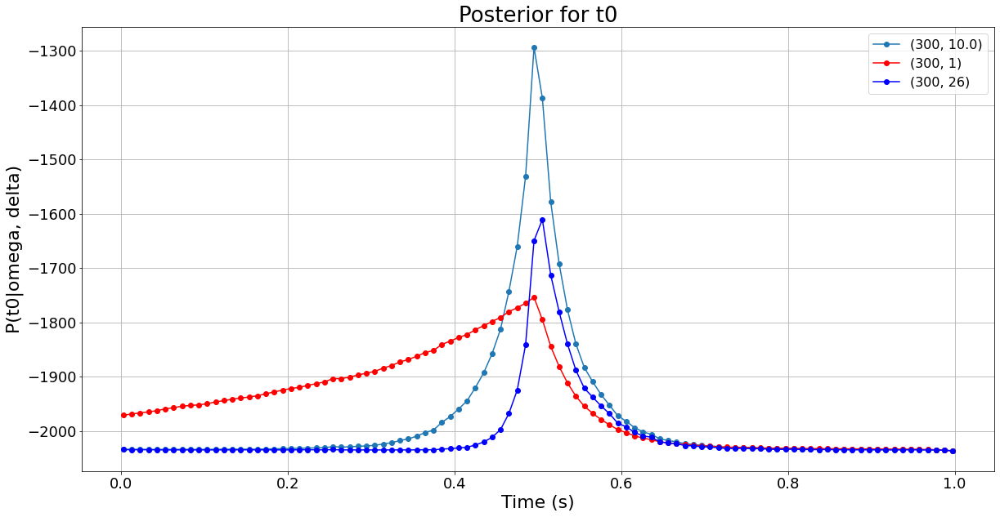

In [9]:
fig = plt.figure(figsize = (20, 10))

#plt.plot(t1, np.exp(p1/np.max(np.abs(p1))), '-o', label = param1)
#plt.plot(t2, np.exp(p2/np.max(np.abs(p2))), '-o', color = 'red', label = param2)
#plt.plot(t3, np.exp(p3/np.max(np.abs(p3))), '-o', color = 'blue', label = param3)

plt.plot(t1, p1, '-o', label = param1)
plt.plot(t2, p2, '-o', color = 'red', label = param2)
plt.plot(t3, p3, '-o', color = 'blue', label = param3)

plt.xlabel('Time (s)', fontsize = 22)
plt.ylabel('P(t0|omega, delta)', fontsize = 22)
plt.title('Posterior for t0', fontsize = 26)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)
plt.legend(fontsize = 16)
plt.grid(True)
plt.show()

Pulsogram

In [13]:
n_omega = 100
n_delta = 100
omega_min = 100
omega_max = 500
delta_min = 1
delta_max = 80

In [14]:
o = pulse(y, t)

In [15]:
%%time
M, linomega, lindelta = pulsogram(o, omega_min, omega_max, n_omega, delta_min, delta_max, n_delta)

CPU times: user 17.3 s, sys: 238 ms, total: 17.5 s
Wall time: 34.9 s


In [46]:
o = bgram.pulse(y, t)

In [ ]:
%%time
M, linomega, lindelta = o.pulsogram(omega_min, omega_max, n_omega, delta_min, delta_max, n_delta, 100)

Maximum evidence with uninformative priors: 

$argmax_{(\omega,\delta)} \int P(\omega, \delta, t_0 | y) dt_0$

In [16]:
i, j = np.unravel_index(np.argmax(M, axis=None), M.shape)
omega_opt, l_opt = (linomega[i], lindelta[j])

topt, p = o.get_llhood_t(omega_opt, l_opt)
t_opt = topt[np.argmax(p)]

print("Maximum evidence for frequency {:.5} Hz (true = {} Hz) and dumping constant {:.5} starting at {:.4} s (true {:.5} at {:.4})".format(omega_opt, omega, l_opt, t_opt, l, t0))

Maximum evidence for frequency 297.98 Hz (true = 300 Hz) and dumping constant 12.97 starting at 0.4955 s (true 10.0 at 0.5)


Plotting fitted model with unknown amplitudes

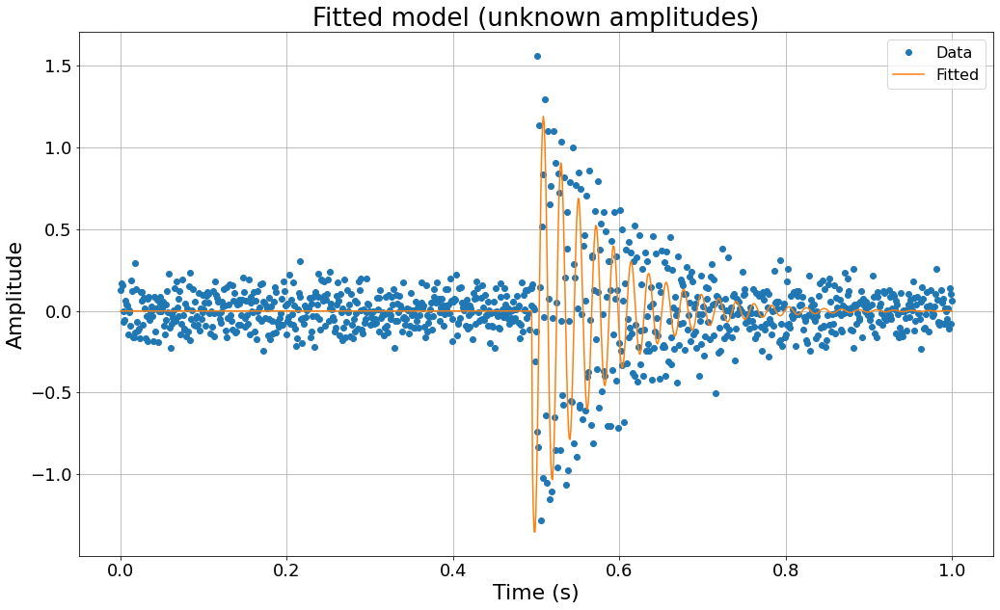

In [17]:
y_fit = np.exp(-l_opt*(t-t_opt))*(np.cos(omega_opt*t) + np.sin(omega_opt*t))
y_fit[np.where(t < t_opt)] = 0

fig = plt.figure(figsize = (17, 10))
plt.plot(t, y, 'o', label = 'Data')
plt.plot(t, y_fit, '-', label = 'Fitted')
plt.xlabel('Time (s)', fontsize = 22)
plt.ylabel('Amplitude', fontsize = 22)
plt.title('Fitted model (unknown amplitudes)', fontsize = 26)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)
plt.legend(fontsize = 16)
plt.grid(True)
plt.show()

Plotting pulsogram

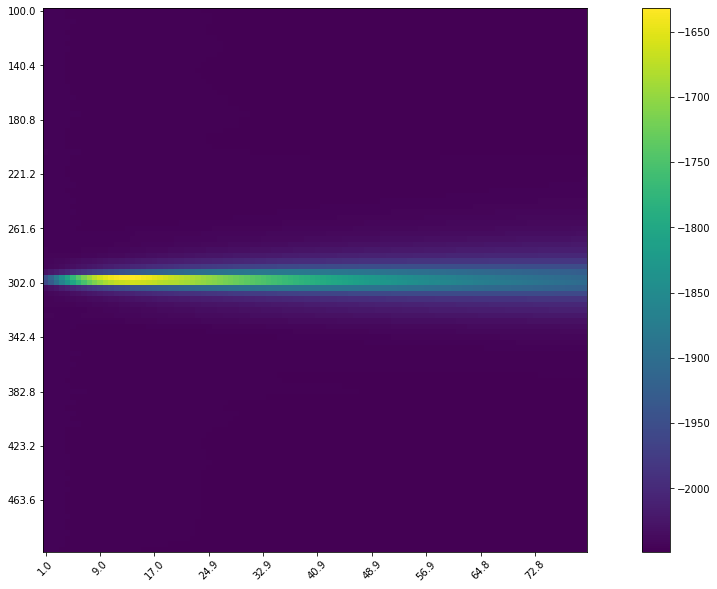

In [18]:
fig = plt.figure(figsize = (20, 10))
plt.imshow(M)

ticks_x = np.arange(0, len(lindelta), step = int(len(lindelta)/10))
plt.xticks(ticks_x, ["{:3.1f}".format(d) for d in lindelta[ticks_x]], rotation = 45)

ticks_y = np.arange(0, len(linomega), step = int(len(linomega)/10))
plt.yticks(ticks_y, ["{:4.1f}".format(o) for o in linomega[ticks_y]])

plt.colorbar()

plt.show()

# Simulated data - frequency and dumping constant linearly related

In [243]:
# Specific heat
gamma = 1.4

# Thermodynamic constant
kappa = gamma

# Density
rho = 998

# Atmospheric pressure
p = 101325  

# Vapour pressure
pv = 2.3

# Surface tension
tau = 72.87

# Shear viscosity
eta = 1.0016

# Static pressure
depth = .22
P0 = 9.8 * rho * depth

In [244]:
# Radius and starting time
r = 1 / 1000
t0 = 0.5

# Calculating frequency and dumping constant
#omega = (1/(r*np.sqrt(rho)))*np.sqrt(3*kappa*(rho-pv + 2*tau/r) - 2*tau/r + pv - 4*eta*eta/(rho*r*r))
omega = np.sqrt((3*gamma*P0)/rho)/(2*np.pi*r)
l = np.pi * (0.014 + (1.1 * 10**(-5))*omega) * omega

# Amplitudes
A = 1
B = 1

In [245]:
from scipy.optimize import newton_krylov

def f(r):
    return (1/(r*np.sqrt(rho)))*np.sqrt(3*kappa*(rho-pv + 2*tau/r) - 2*tau/r + pv - 4*eta*eta/(rho*r*r))-omega*.5

    
newton_krylov(f, xin = r/3)*1000

21.330819769442463

In [246]:
noise = np.random.normal(loc = 0, scale = 0.1, size = 10000)
t = np.linspace(0, 1, 10000)

f = np.exp(-l*(t-t0))*(A*np.cos(2*np.pi*omega*t) + B*np.sin(2*np.pi*omega*t))
n0 = np.min(np.where(t >= t0))
f[:n0] = 0

y = noise + f

In [247]:
print(omega, l)

478.92681646523437 28.990790678772104


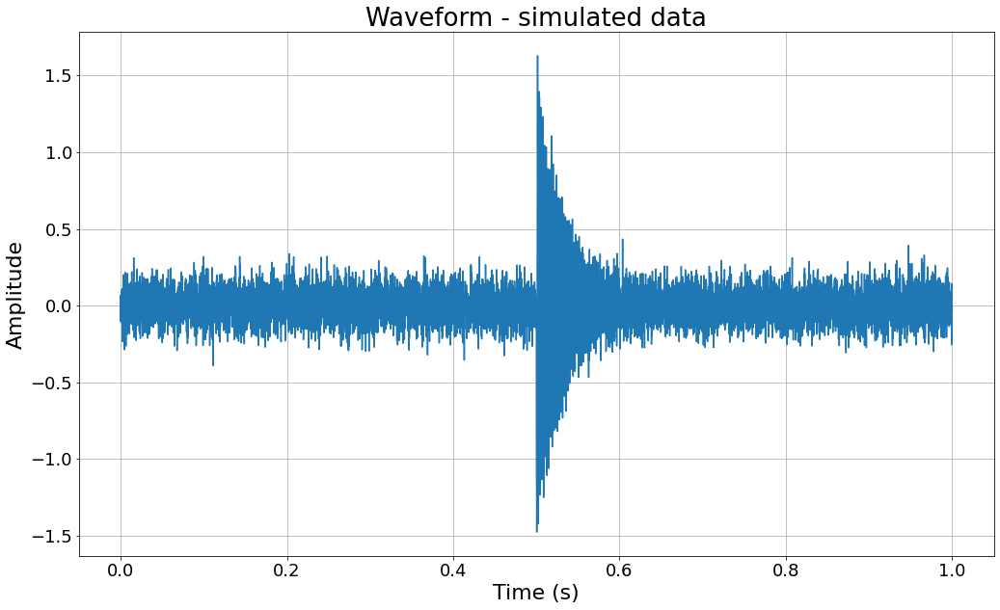

In [248]:
fig = plt.figure(figsize = (17, 10))
plt.plot(t, y)
plt.xlabel('Time (s)', fontsize = 22)
plt.ylabel('Amplitude', fontsize = 22)
plt.title('Waveform - simulated data', fontsize = 26)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)
plt.grid(True)
plt.show()

In [249]:
r_min = .5 / 1000
r_max = 1.5 / 1000
n_r = 500
n_t = 500

In [250]:
%%time
o = abubble(y, t)
M, linr = bubblegram(o, r_min, r_max, n_r, n_t)
lint = np.linspace(o.t_min, o.t_max, n_t)

CPU times: user 6.6 s, sys: 112 ms, total: 6.71 s
Wall time: 59.1 s


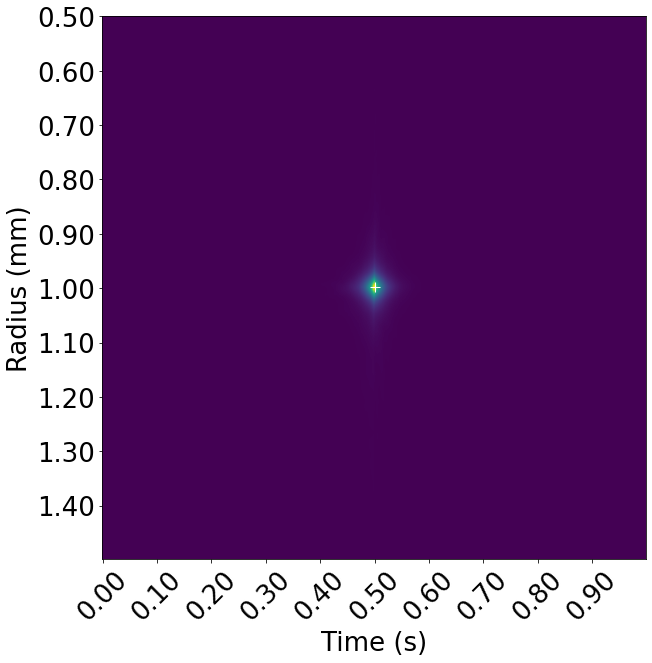

In [265]:
fig = plt.figure(figsize = (20, 10))
plt.imshow(M)

ticks_x = np.arange(0, len(lint), step = int(len(lint)/10))
plt.xticks(ticks_x, ["{:1.2f}".format(d) for d in lint[ticks_x]], rotation = 45, fontsize = 26)
plt.xlabel("Time (s)", fontsize = 26)

ticks_y = np.arange(0, len(linr), step = int(len(linr)/10))
plt.yticks(ticks_y, ["{:1.2f}".format(1000*o) for o in linr[ticks_y]], fontsize = 26)
plt.ylabel("Radius (mm)", fontsize = 26)

plt.plot(np.argmin(abs(lint-t0)), np.argmin(abs(linr - r)), 'w+', markersize = 10)

plt.show()

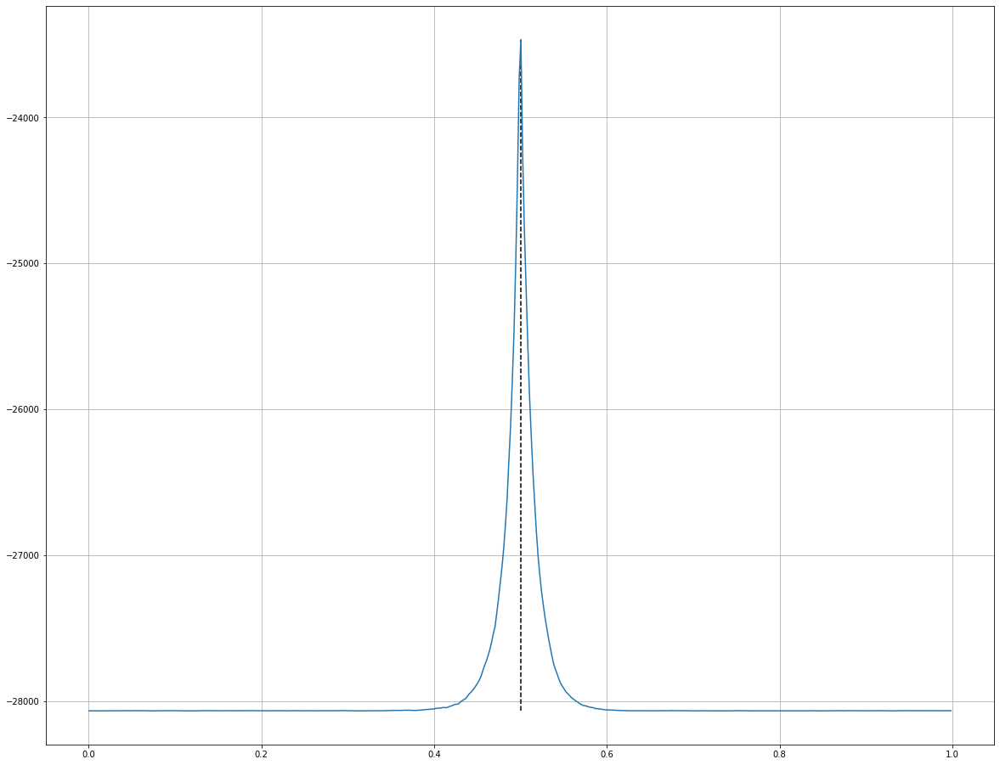

In [252]:
maxlike = np.max(M, axis = 0)
fig = plt.figure(figsize = (20, 16))
plt.plot(lint, maxlike)

plt.vlines(x = t0, ymin = min(maxlike), ymax = max(maxlike), linestyles = '--')

plt.grid(True)
plt.show()

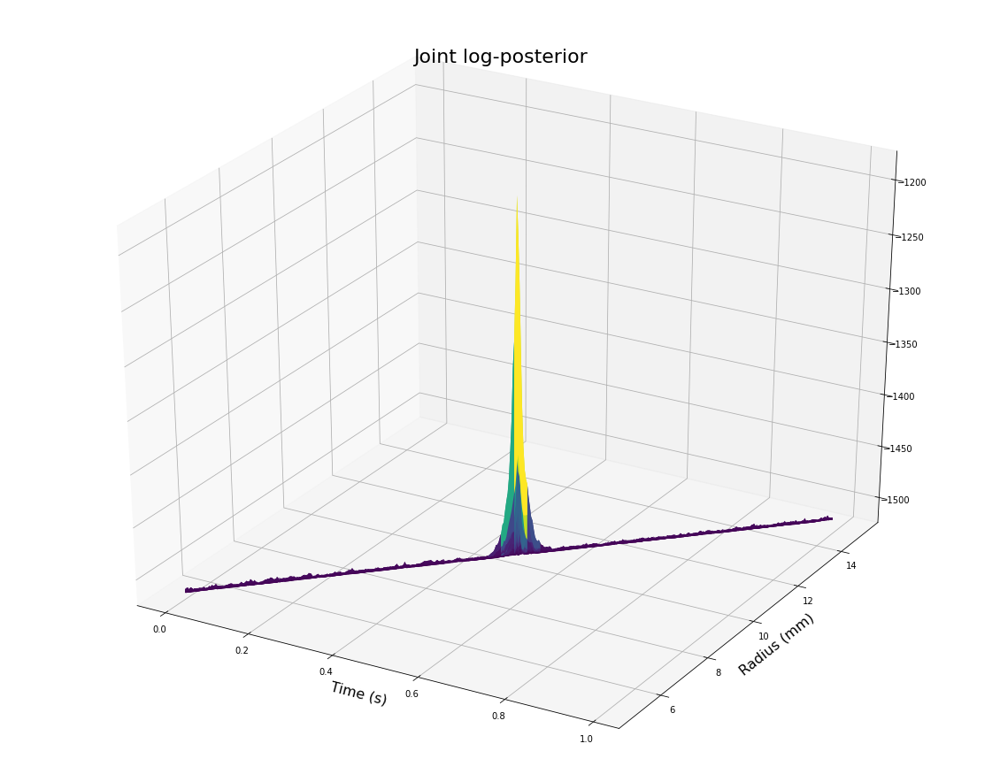

In [406]:
from mpl_toolkits import mplot3d

fig = plt.figure(figsize = (20, 16))
ax = plt.axes(projection='3d')

ax.plot_surface(lint, 1000*linr, M,cmap='viridis', edgecolor='none')
ax.set_title('Joint log-posterior', fontsize = 22)
plt.xlabel("Time (s)", fontsize = 16)
plt.ylabel("Radius (mm)", fontsize = 16)
plt.show()

## Spectrogram

In [253]:
fs = 10000

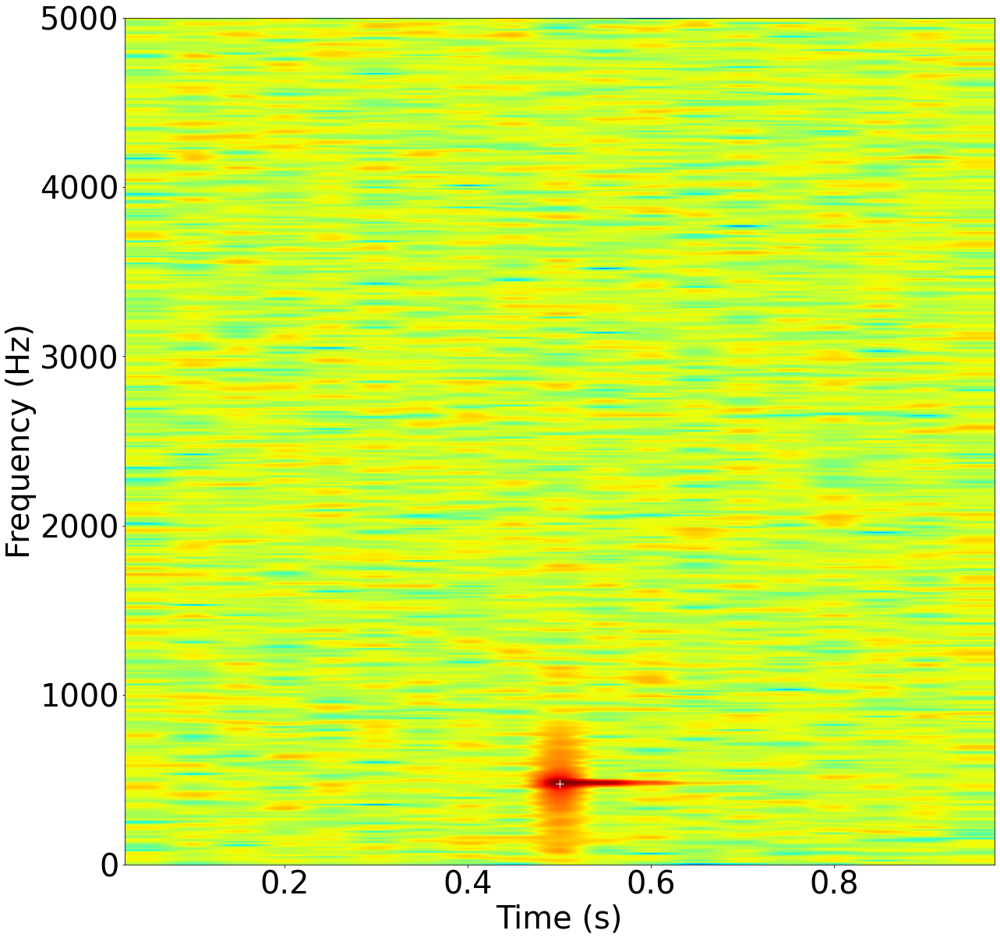

In [269]:
res = 10
m = int(fs / res)

fig, ax = plt.subplots(1, 1, figsize = (20, 20))
spec, freq, ts, f = ax.specgram(y, NFFT=m, Fs=fs, Fc=0, noverlap = int(m/2),
         cmap=plt.cm.jet, xextent=None, pad_to=None, sides='default',
         scale_by_freq=None, mode='psd', scale='default', detrend = 'default', window = np.blackman(m))

plt.plot(t0, omega, 'w+', markersize = 10)

plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")

plt.rcParams.update({'font.size' : 20})
plt.show()

#f.set_clim(-80,-55)
#ax.set_ylim([0, np.max(freq)])
#ax.set_ylim([0, 1000])


# Simulated data - sequence of bubbles

In [300]:
N = 10000
tmax = 1
t = np.linspace(0, tmax, N)
y = np.zeros(N)

nbubbles = 10
tstart = np.random.uniform(0, tmax, nbubbles)
rs = np.random.uniform(.5, 1.5, nbubbles) / 1000
omegas = []
for i in range(nbubbles):
    
    # Radius and starting time    
    t0 = tstart[i]
    r = rs[i]

    # Calculating frequency and dumping constant
    #omega = (1/(r*np.sqrt(rho)))*np.sqrt(3*kappa*(rho-pv + 2*tau/r) - 2*tau/r + pv - 4*eta*eta/(rho*r*r))
    omega = np.sqrt((3*gamma*P0)/rho)/(2*np.pi*r)
    omegas.append(omega)
    l = np.pi * (0.014 + (1.1 * 10**(-5))*omega) * omega

    # Amplitudes
    A = 1
    B = 1

    noise = np.random.normal(loc = 0, scale = 0.05, size = N)

    f = np.exp(-l*(t-t0))*(A*np.cos(2*np.pi*omega*t) + B*np.sin(2*np.pi*omega*t))
    n0 = np.min(np.where(t >= t0))
    f[:n0] = 0

    y = y + noise + f

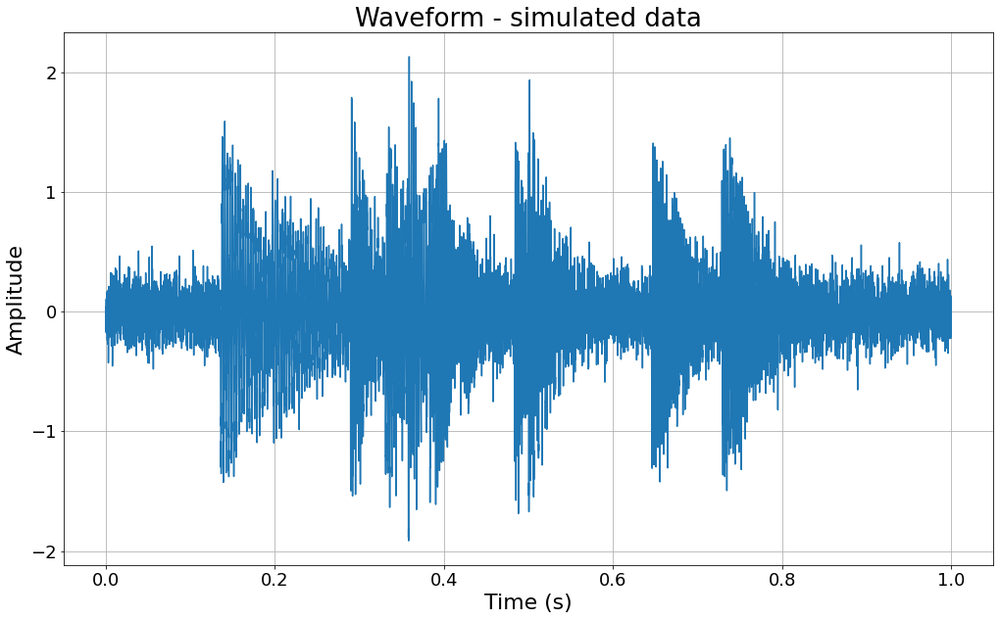

In [301]:
fig = plt.figure(figsize = (17, 10))
plt.plot(t, y)
plt.xlabel('Time (s)', fontsize = 22)
plt.ylabel('Amplitude', fontsize = 22)
plt.title('Waveform - simulated data', fontsize = 26)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)
plt.grid(True)
plt.show()

In [302]:
r_min = .1 / 1000
r_max = 2. / 1000
n_r = 500
n_t = 500

In [303]:
%%time
o = abubble(y, t)
M, linr = bubblegram(o, r_min, r_max, n_r, n_t)
lint = np.linspace(o.t_min, o.t_max, n_t)

CPU times: user 6.63 s, sys: 262 ms, total: 6.89 s
Wall time: 59.5 s


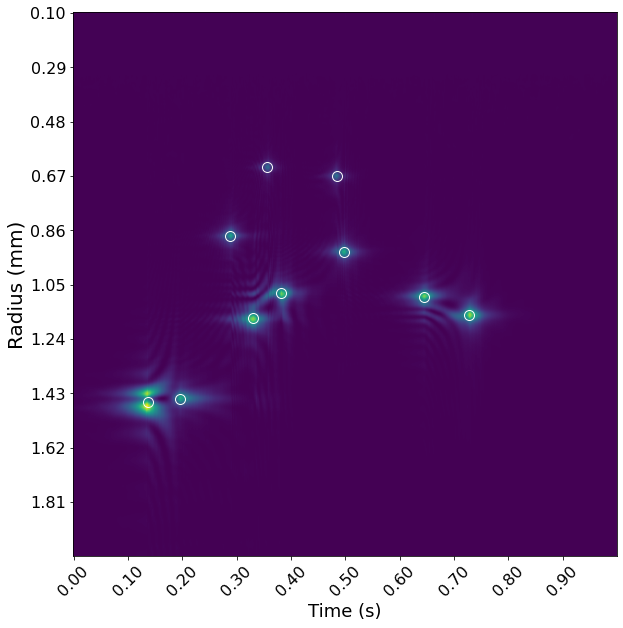

In [304]:
fig = plt.figure(figsize = (20, 10))
plt.imshow(M)

ticks_x = np.arange(0, len(lint), step = int(len(lint)/10))
plt.xticks(ticks_x, ["{:1.2f}".format(d) for d in lint[ticks_x]], rotation = 45, fontsize = 16)
plt.xlabel("Time (s)", fontsize = 18)

ticks_y = np.arange(0, len(linr), step = int(len(linr)/10))
plt.yticks(ticks_y, ["{:1.2f}".format(1000*o) for o in linr[ticks_y]], fontsize = 16)
plt.ylabel("Radius (mm)", fontsize = 20)

for i in range(nbubbles):
    plt.plot(np.argmin(abs(lint-tstart[i])), np.argmin(abs(linr - rs[i])), 'wo', markerfacecolor = "None", markersize = 10)

plt.show()

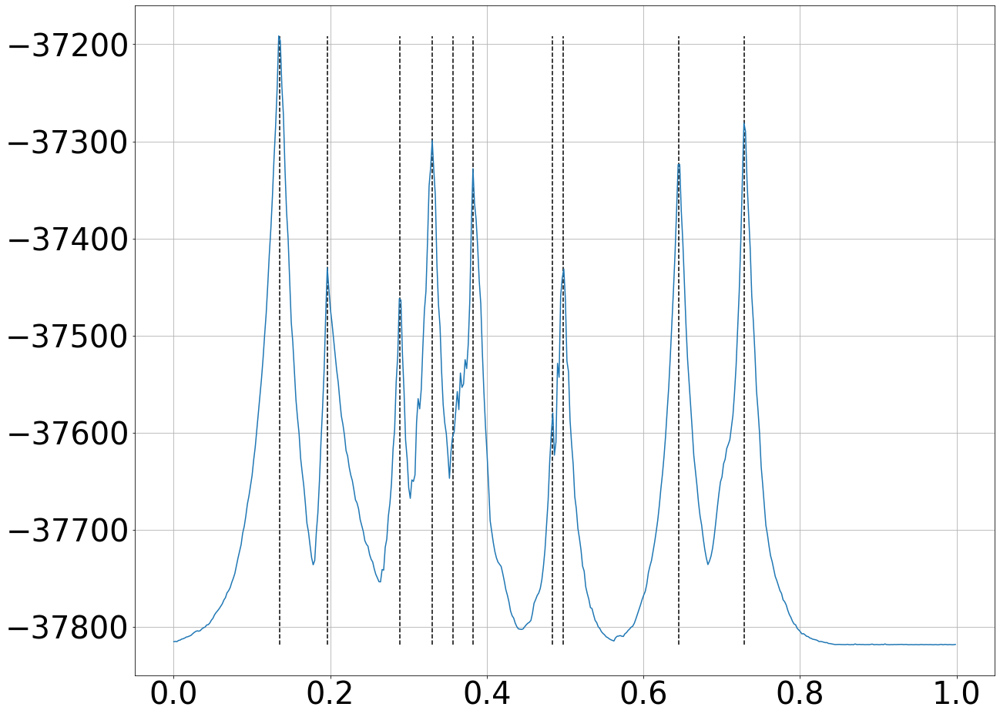

In [305]:
maxlike = np.max(M, axis = 0)
fig = plt.figure(figsize = (20, 16))
plt.plot(lint, maxlike)

for i in range(nbubbles):
    plt.vlines(x = tstart[i], ymin = min(maxlike), ymax = max(maxlike), linestyles = '--')

plt.grid(True)
plt.show()

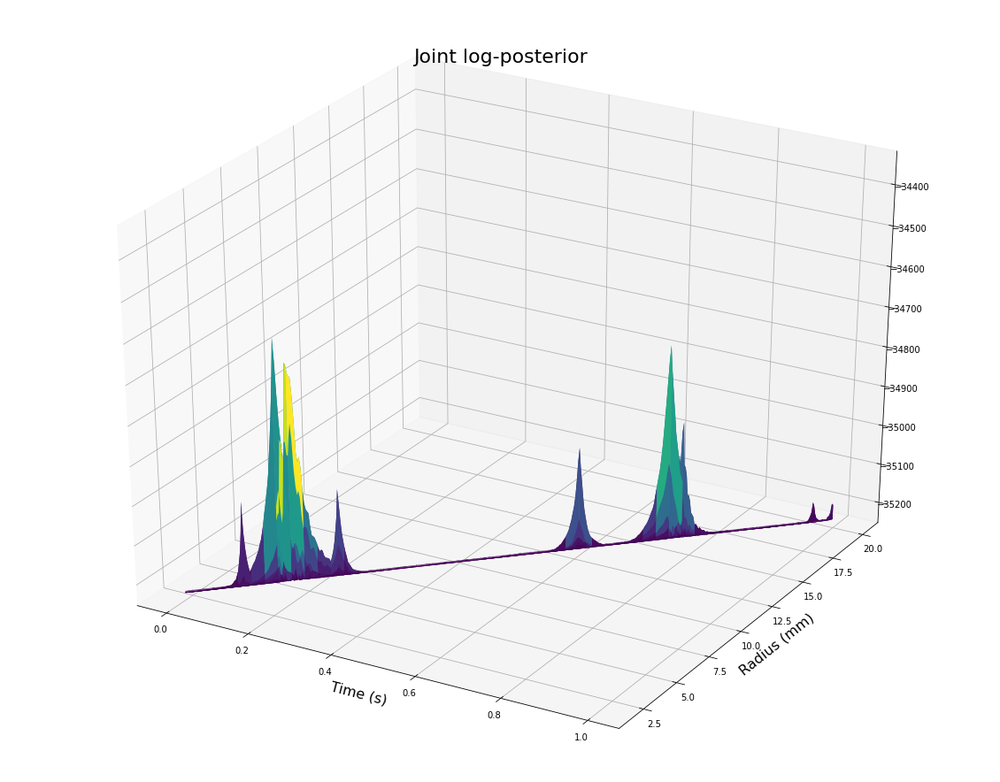

In [485]:
from mpl_toolkits import mplot3d

fig = plt.figure(figsize = (20, 16))
ax = plt.axes(projection='3d')

X, Y = np.meshgrid(lint, 1000*linr)
ax.plot_surface(X, Y, M,cmap='viridis', edgecolor='none')
ax.set_title('Joint log-posterior', fontsize = 22)
plt.xlabel("Time (s)", fontsize = 16)
plt.ylabel("Radius (mm)", fontsize = 16)
plt.show()

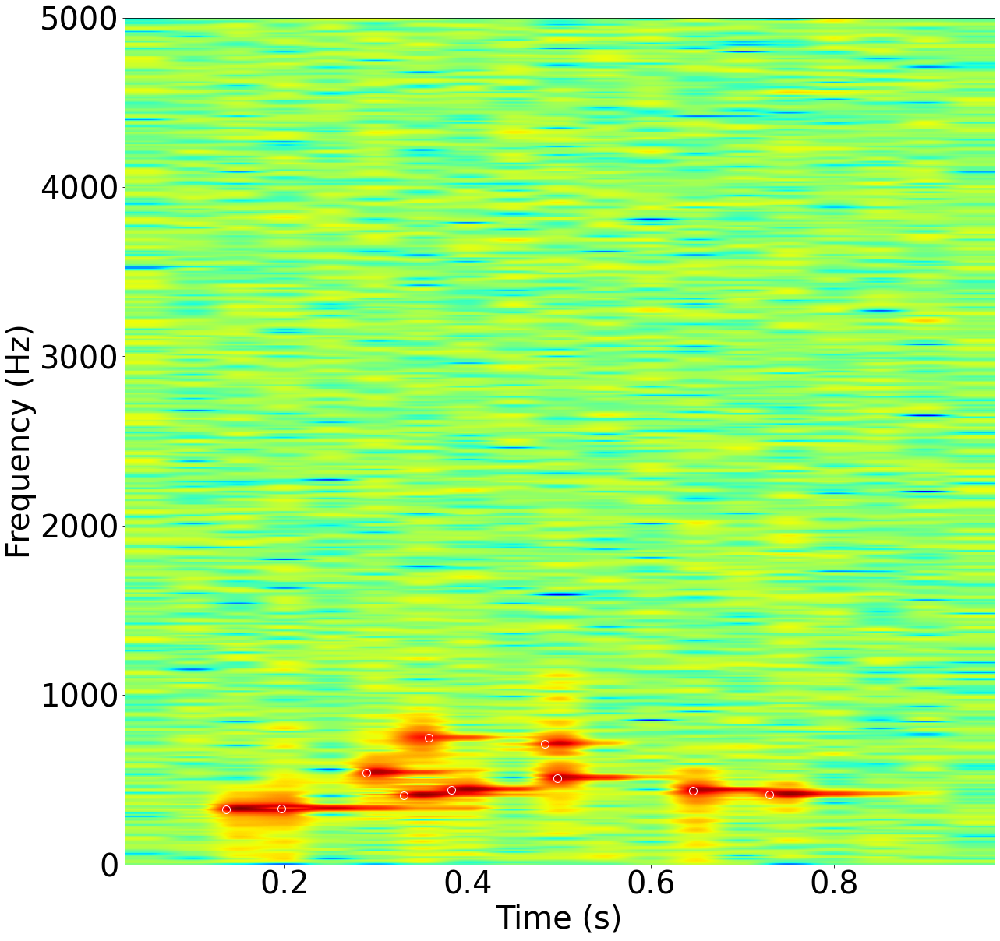

In [306]:
res = 10
m = int(fs / res)

fig, ax = plt.subplots(1, 1, figsize = (20, 20))
spec, freq, ts, f = ax.specgram(y, NFFT=m, Fs=fs, Fc=0, noverlap = int(m/2),
         cmap=plt.cm.jet, xextent=None, pad_to=None, sides='default',
         scale_by_freq=None, mode='psd', scale='default', detrend = 'default', window = np.blackman(m))

for i in range(nbubbles):
    plt.plot(tstart[i], omegas[i], 'wo', markerfacecolor = "None", markersize = 10)

plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")

plt.rcParams.update({'font.size' : 40})

#ax.set_ylim([0, 1000])
plt.show()

# Testing on lab data

In [803]:
import scipy.io.wavfile

wav = 'data/bubble_2.5.wav'

fs, y = scipy.io.wavfile.read(wav)
y = y / max(y)
t = np.linspace(0, len(y)/fs, len(y))

print("{} seconds of signal, {} points".format(len(y)/fs, len(y)))

60.0 seconds of signal, 2880000 points


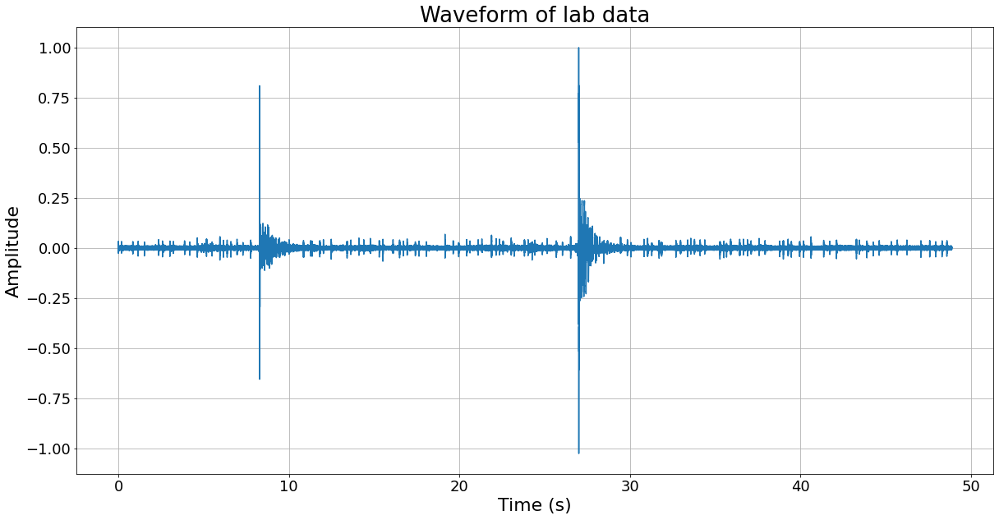

In [771]:
fig = plt.figure(figsize = (20, 10))
plt.plot(t, y)
plt.xlabel('Time (s)', fontsize = 22)
plt.ylabel('Amplitude', fontsize = 22)
plt.title('Waveform of lab data', fontsize = 26)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)
plt.grid(True)
plt.show()

### Bandpass filter

In [804]:
low_pass = 200
high_pass = 3000

In [805]:
from scipy.signal import butter, sosfilt, decimate

N = 20
sos = butter(N, [low_pass,high_pass], 'bandpass', fs = fs, output='sos')
yf = sosfilt(sos, y)

Selecting section and playing

In [806]:
# 2.5 mm:
start_time = 0.55
end_time = .65

# 4 mm
# start_time = 0.75
# end_time = .85

# 6 mm
# start_time = 0.8
# end_time = .9

In [800]:
import sounddevice as sd
lb = int(start_time*fs)
ub = int(end_time*fs)

#sd.play(y[lb:ub], samplerate=fs)
yb = yf[lb:ub]
tb = t[lb:ub]
print("{} seconds, {} points".format(end_time - start_time, len(yb)))

0.09999999999999998 seconds, 4800 points


Plot section. 

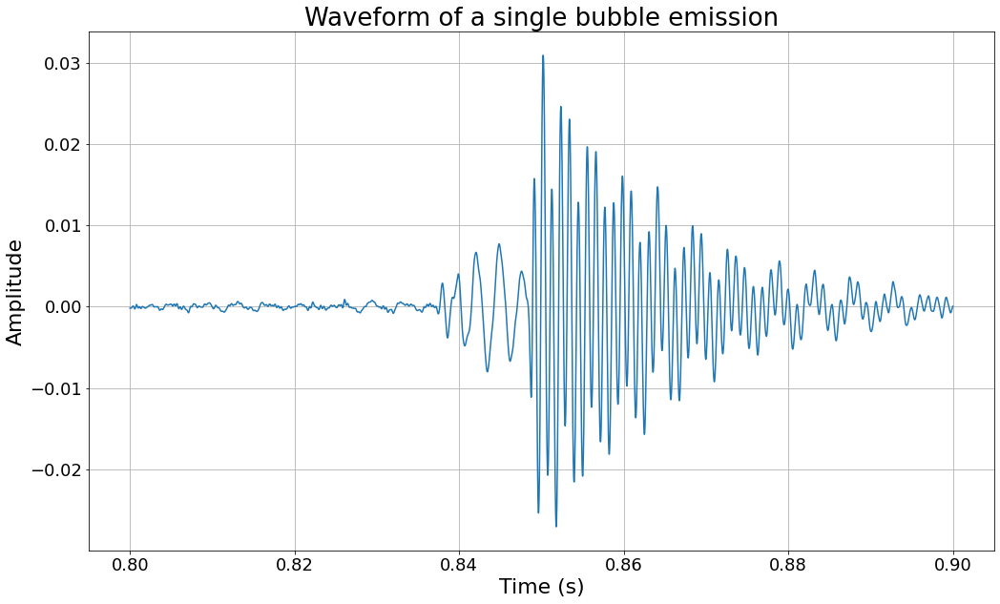

In [785]:
fig = plt.figure(figsize = (17, 10))
plt.plot(tb, yb)
plt.xlabel('Time (s)', fontsize = 22)
plt.ylabel('Amplitude', fontsize = 22)
plt.title('Waveform of a single bubble emission', fontsize = 26)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)
plt.grid(True)
plt.show()

### Decimating

In [603]:
yb = decimate(yb, 4)
fs = int(fs / 4)
tb = np.linspace(0, len(yb)/fs, len(yb))

print("{} seconds of signal, {} points".format(len(yb)/fs, len(yb)))

0.4 seconds of signal, 4800 points


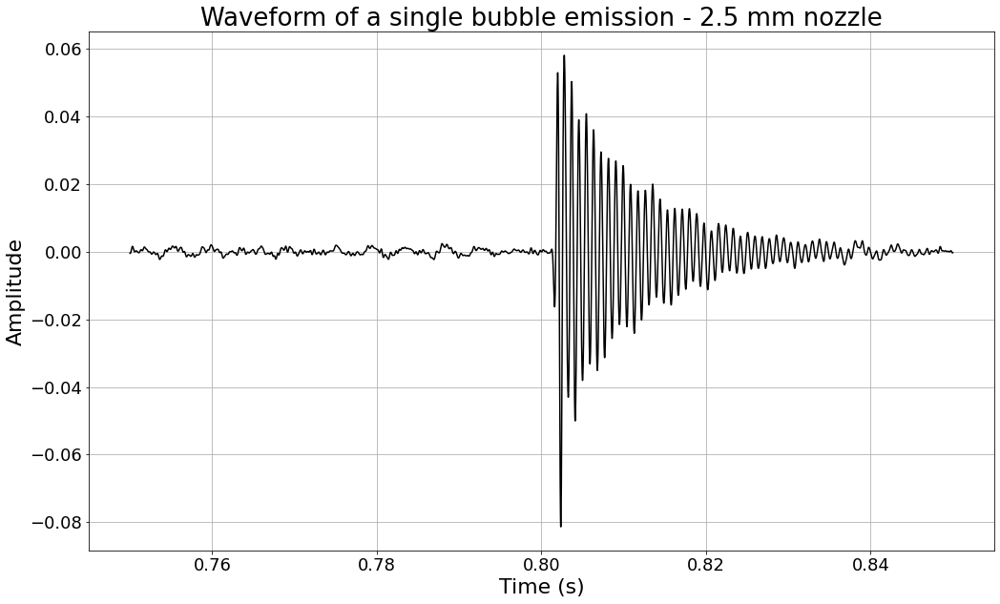

In [808]:
fig = plt.figure(figsize = (17, 10))
plt.plot(tb, yb, 'k-')
plt.xlabel('Time (s)', fontsize = 22)
plt.ylabel('Amplitude', fontsize = 22)
plt.title('Waveform of a single bubble emission - 2.5 mm nozzle', fontsize = 26)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)
plt.grid(True)
plt.show()

/home/paulo/.local/lib/python3.6/site-packages/scipy/signal/spectral.py:1969: UserWarning: nperseg = 2000 is greater than input length  = 1920, using nperseg = 1920
  .format(nperseg, input_length))


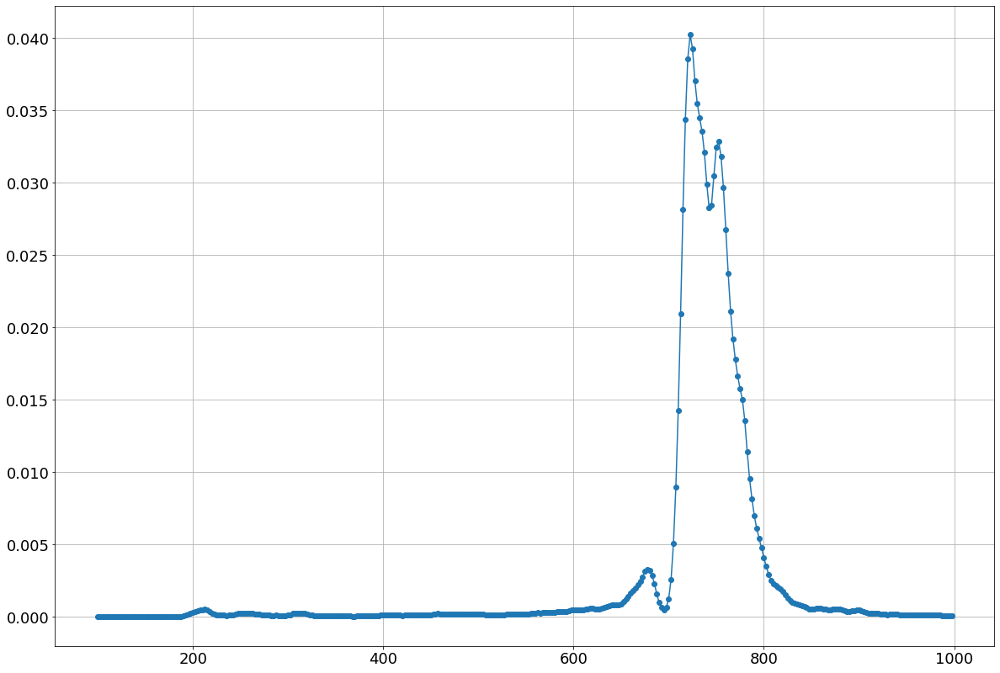

In [572]:
from scipy.signal import welch

f, psd = welch(yb, fs = fs, nperseg = 2000)


imin = np.argmin((f - 100)**2)
#imin = 0
imax = np.argmin((f - 1000)**2)
#imax = len(f)

psd = psd[imin:imax]    
f = f[imin:imax]
psd = psd / sum(psd)

plt.figure(figsize = (20, 14))
plt.plot(f, psd, 'o-')
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)
plt.grid(True)

# Modelling lab data

In [735]:
o = pulse(yb, tb)

In [671]:
n_omega = 100
n_delta = 100
omega_min = 600
omega_max = 1000
delta_min = 40
delta_max = 500

In [672]:
%%time
M, linomega, lindelta = pulsogram(o, omega_min, omega_max, n_omega, delta_min, delta_max, n_delta)

CPU times: user 52.3 s, sys: 1.3 s, total: 53.6 s
Wall time: 1min 59s


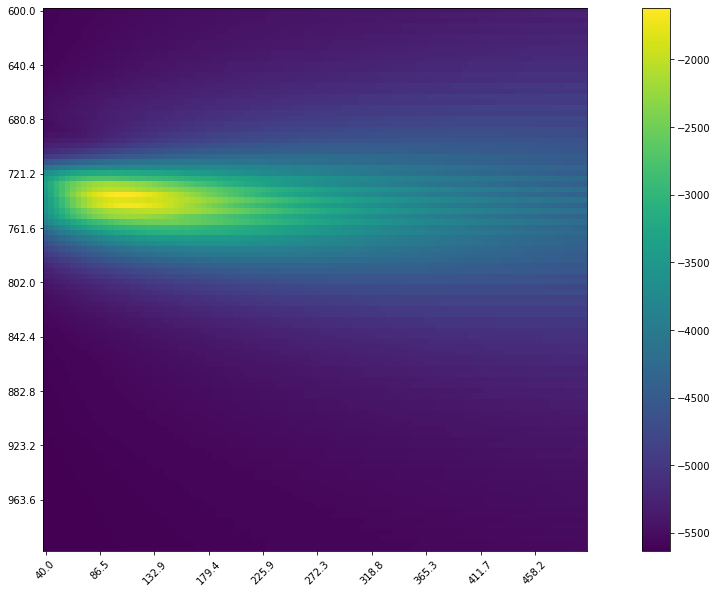

In [673]:
fig = plt.figure(figsize = (20, 10))
plt.imshow(M)

ticks_x = np.arange(0, len(lindelta), step = int(len(lindelta)/10))
plt.xticks(ticks_x, ["{:3.1f}".format(d) for d in lindelta[ticks_x]], rotation = 45)

ticks_y = np.arange(0, len(linomega), step = int(len(linomega)/10))
plt.yticks(ticks_y, ["{:4.1f}".format(o) for o in linomega[ticks_y]])

plt.colorbar()

plt.show()

In [677]:
b = abubble(yb, tb)
b.delta(3000)

3.0019812600262122e-05

## Nonlinear parameters as functions of bubble diameter

In [786]:
o = abubble(yb,tb)

In [787]:
r1 = 1
r2 = 6
r3 = 2
t1, p1 = o.get_llhood_t(r1/1000)
t2, p2 = o.get_llhood_t(r2/1000)
t3, p3 = o.get_llhood_t(r3/1000)

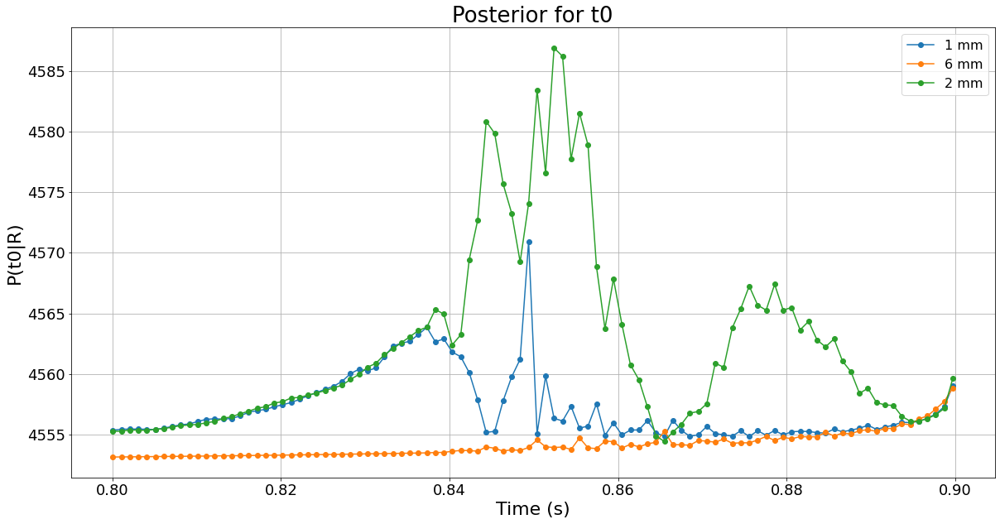

In [788]:
fig = plt.figure(figsize = (20, 10))

plt.plot(t1, p1, '-o', label = "{} mm".format(r1))
plt.plot(t2, p2, '-o', label = "{} mm".format(r2))
plt.plot(t3, p3, '-o', label = "{} mm".format(r3))

plt.xlabel('Time (s)', fontsize = 22)
plt.ylabel('P(t0|R)', fontsize = 22)
plt.title('Posterior for t0', fontsize = 26)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)
plt.legend(fontsize = 16)
plt.grid(True)

plt.show()

In [790]:
r_min = .2 / 1000
r_max = 2. / 1000
n_r = 500
n_t = 500

In [791]:
%%time
M, linr = bubblegram(o, r_min, r_max, n_r, n_t)
lint = np.linspace(o.t_min, o.t_max, n_t)

CPU times: user 6.56 s, sys: 138 ms, total: 6.7 s
Wall time: 29.3 s


2.5 mm: Maximum evidence for radius 0.6509 mm with frequency 735.79 Hz and dumping constant 51.071 starting at 0.584 s

4 mm: Maximum evidence for radius 0.42725 mm with frequency 1120.9 Hz and dumping constant 92.723 starting at 0.8018 s

6 mm: Maximum evidence for radius 0.51022 mm with frequency 938.67 Hz and dumping constant 71.733 starting at 0.849 s


In [792]:
i, j = np.unravel_index(np.argmax(M, axis=None), M.shape)
r_opt, topt = (linr[i], lint[j])

f_opt = o.omega(r_opt)
d_opt = o.delta(r_opt)

print("Maximum evidence for radius {:.5} mm with frequency {:.5} Hz and dumping constant {:.5} starting at {:.4} s".format(1000*r_opt, f_opt, d_opt, topt))

Maximum evidence for radius 0.51022 mm with frequency 938.67 Hz and dumping constant 71.733 starting at 0.849 s


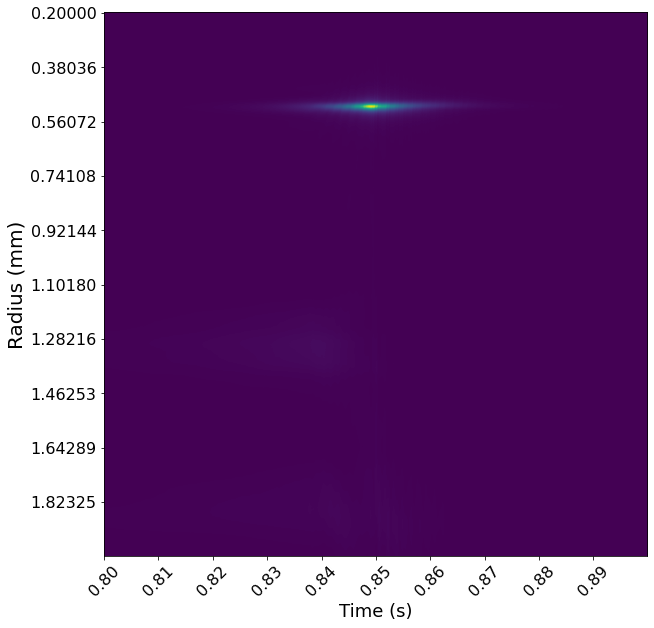

In [793]:
fig = plt.figure(figsize = (20, 10))
plt.imshow(M)

ticks_x = np.arange(0, len(lint), step = int(len(lint)/10))
plt.xticks(ticks_x, ["{:1.2f}".format(d) for d in lint[ticks_x]], rotation = 45, fontsize = 16)
plt.xlabel("Time (s)", fontsize = 18)

ticks_y = np.arange(0, len(linr), step = int(len(linr)/10))
plt.yticks(ticks_y, ["{:1.5f}".format(1000*o) for o in linr[ticks_y]], fontsize = 16)
plt.ylabel("Radius (mm)", fontsize = 20)

plt.show()

# Pool - 3 flows, 3 diameters

Vazão 2.0, diâmetro 2.5
107.0 seconds of signal, 5136000 points
2 seconds, 96000 points
2.0 seconds of signal, 9600 points


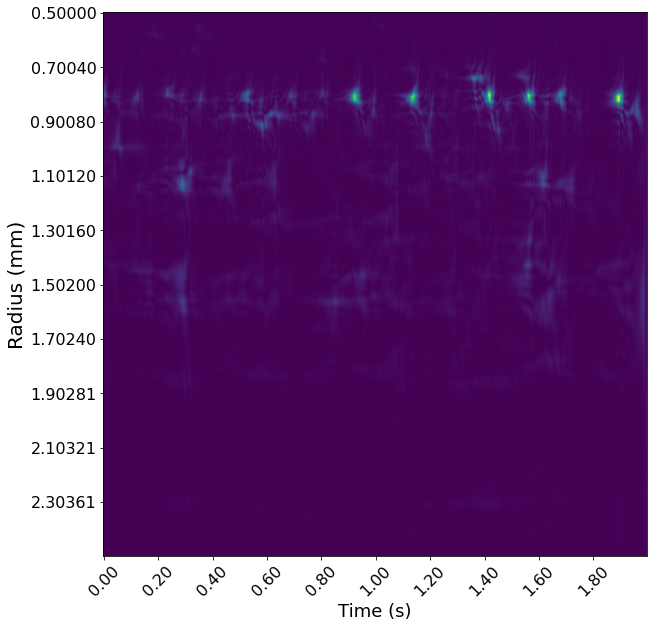

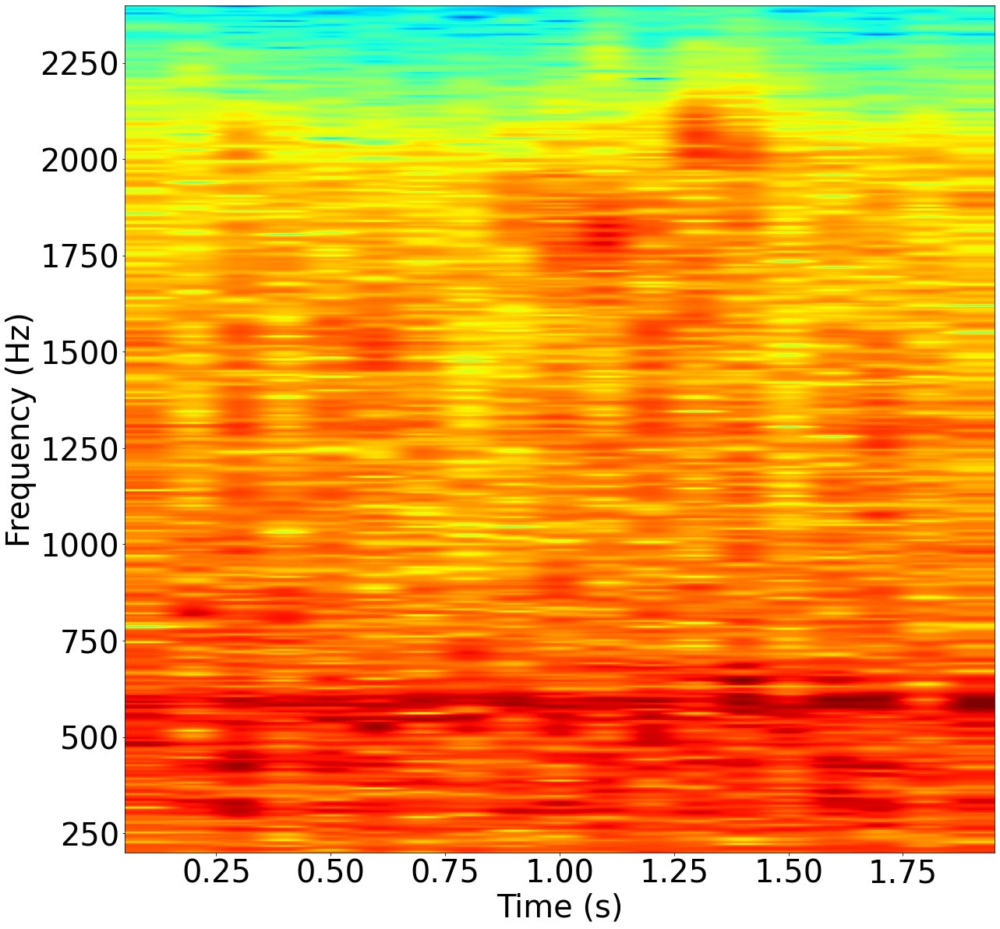

Vazão 2.0, diâmetro 6.0
173.0 seconds of signal, 8304000 points
2 seconds, 96000 points
2.0 seconds of signal, 9600 points


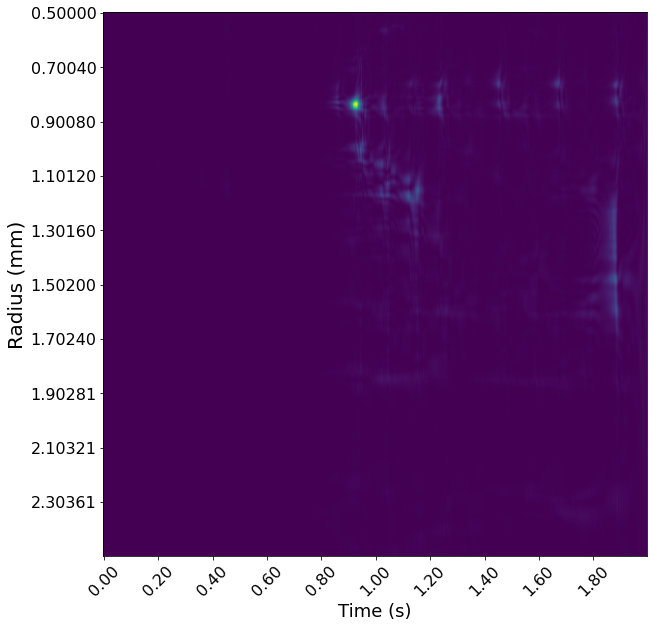

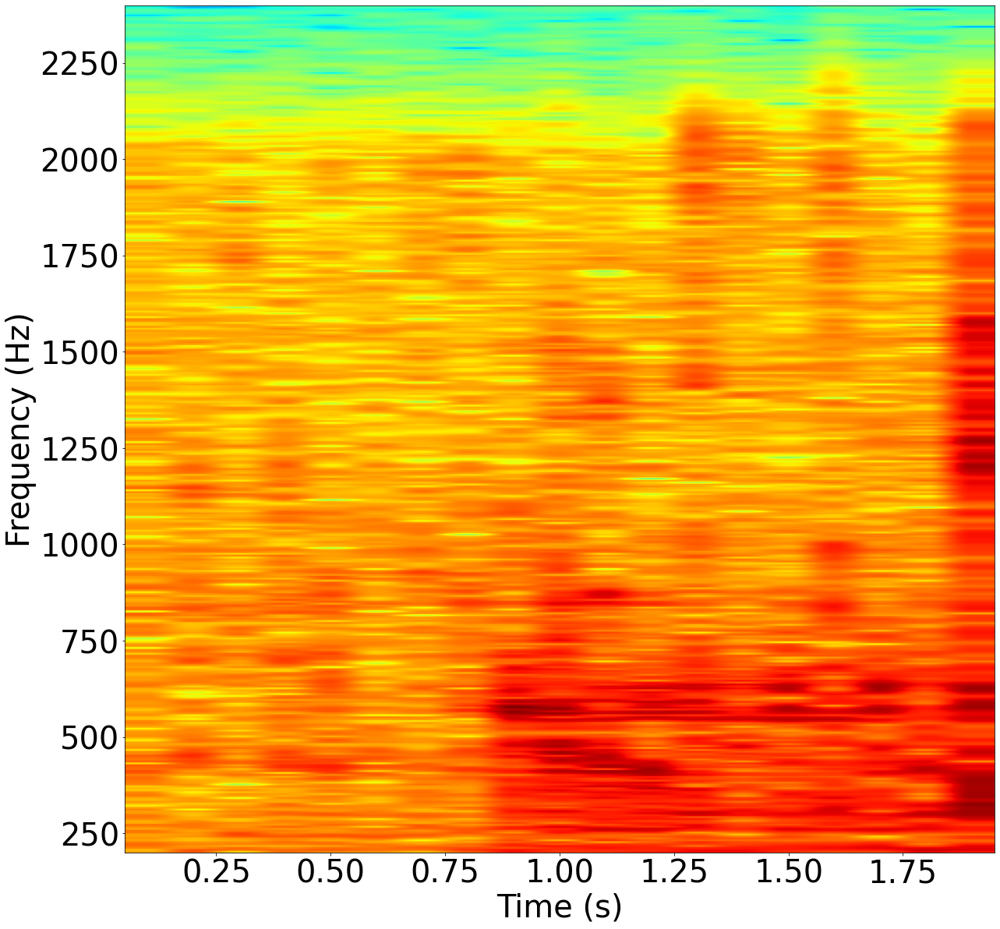

Vazão 2.0, diâmetro 11.0
70.0 seconds of signal, 3360000 points
2 seconds, 96000 points
2.0 seconds of signal, 9600 points


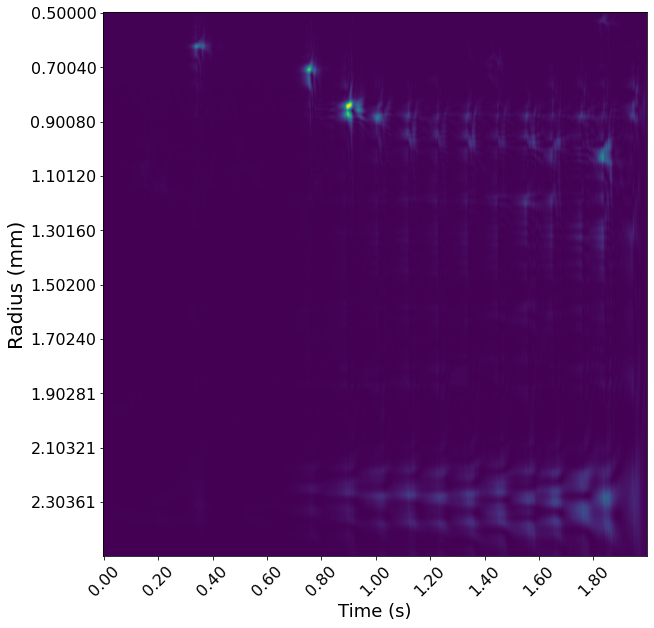

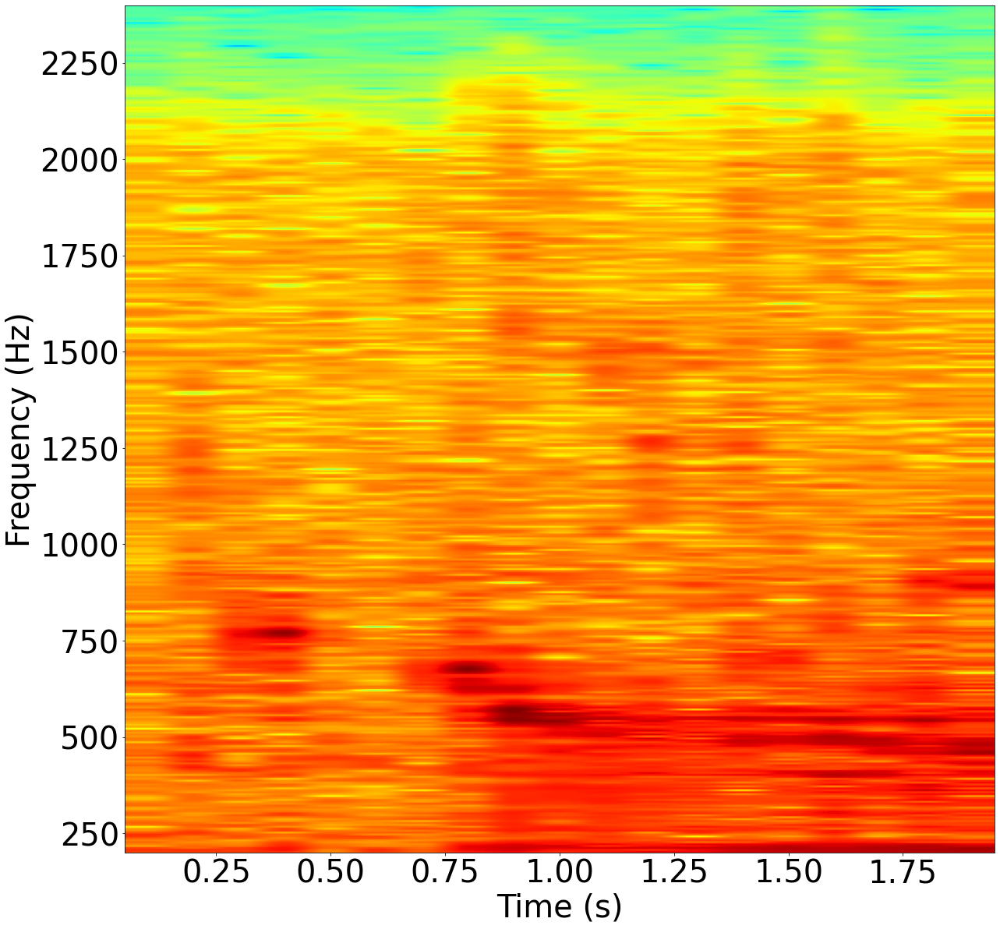

Vazão 5.0, diâmetro 2.5
91.0 seconds of signal, 4368000 points
2 seconds, 96000 points
2.0 seconds of signal, 9600 points


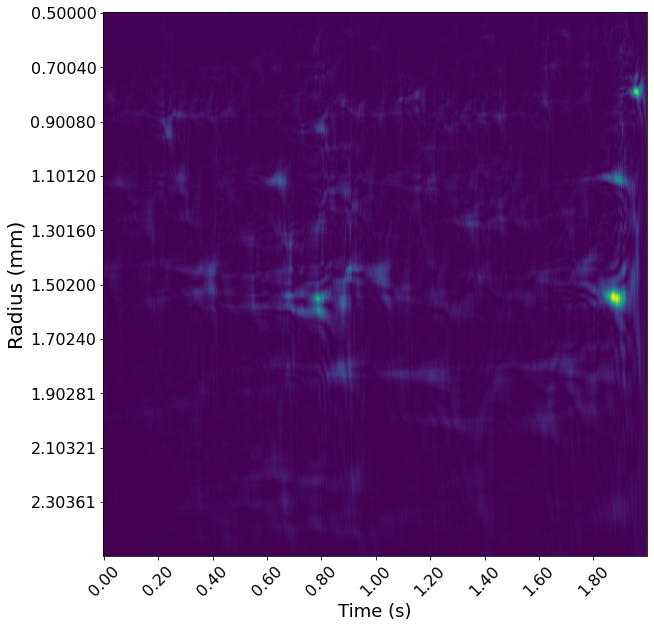

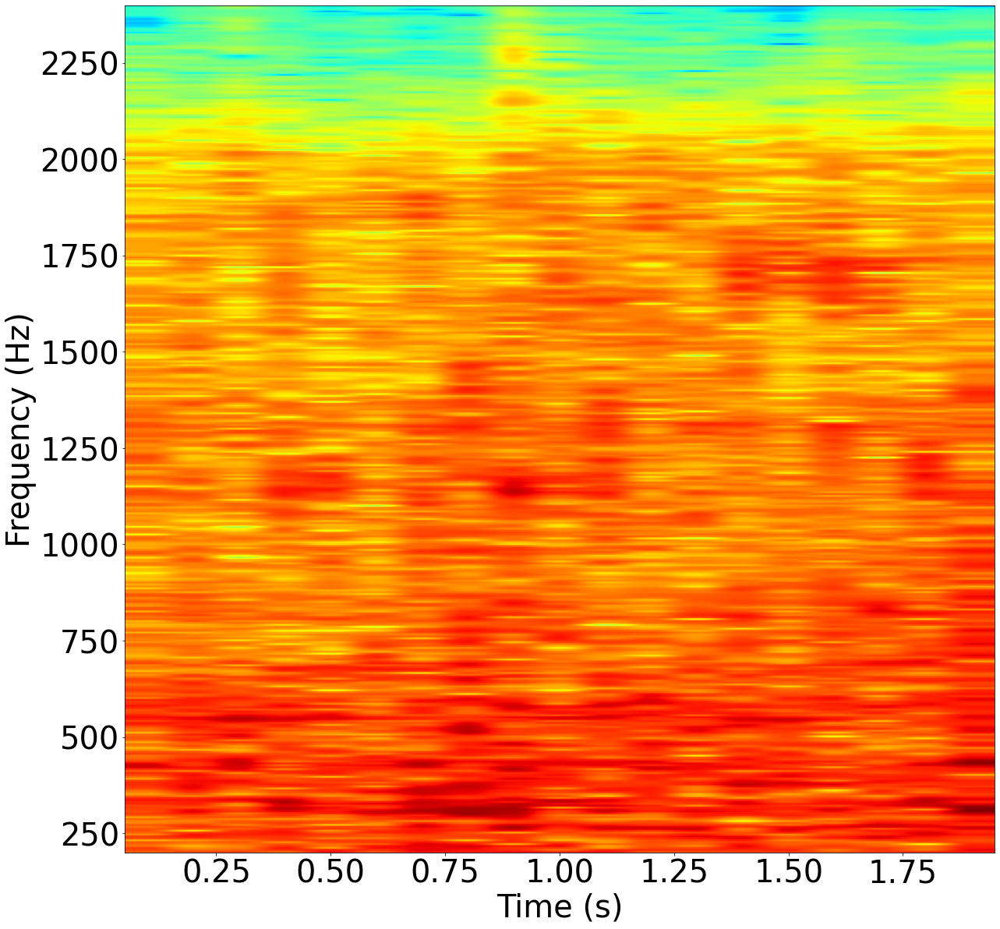

Vazão 5.0, diâmetro 6.0
80.0 seconds of signal, 3840000 points
2 seconds, 96000 points
2.0 seconds of signal, 9600 points


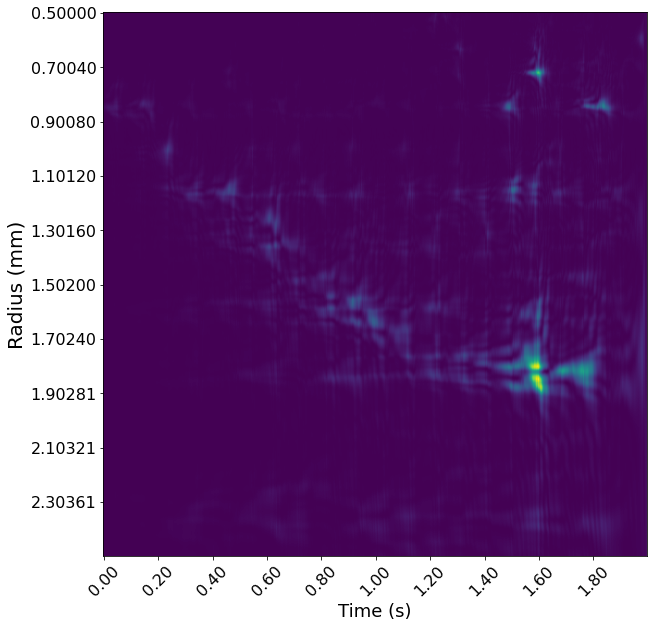

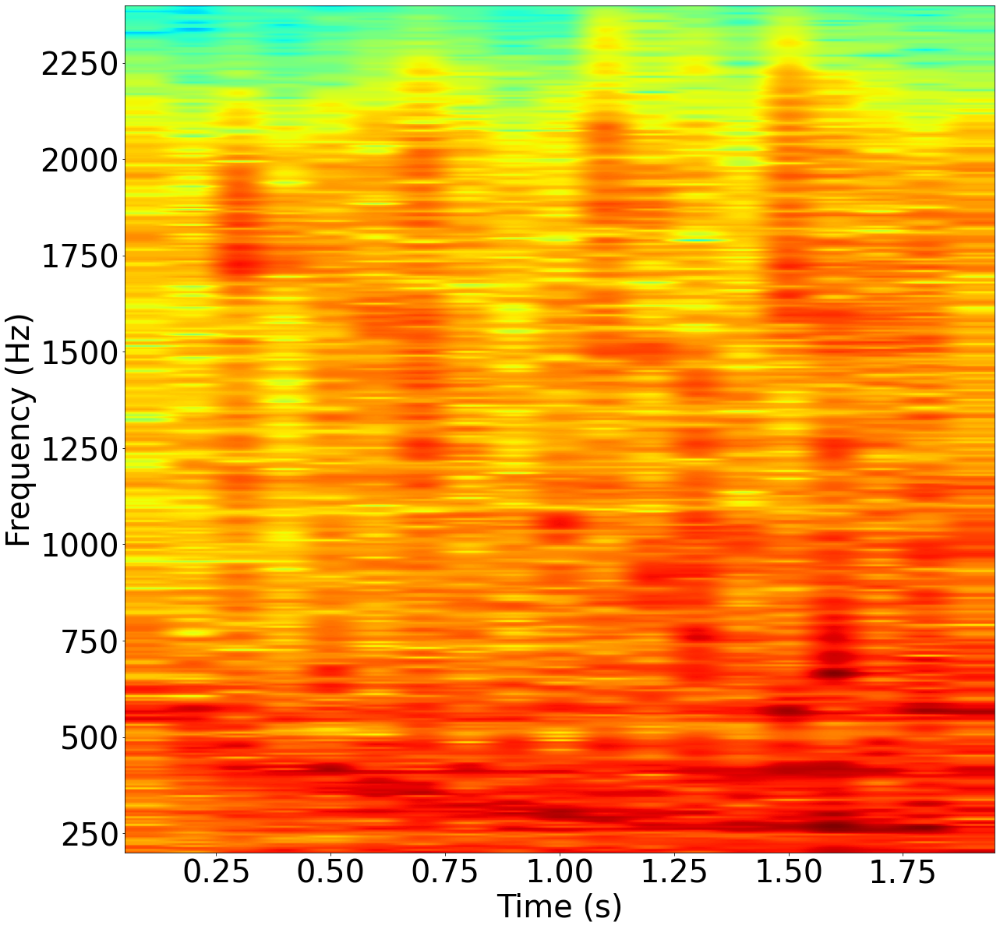

Vazão 5.0, diâmetro 11.0
79.0 seconds of signal, 3792000 points
2 seconds, 96000 points
2.0 seconds of signal, 9600 points


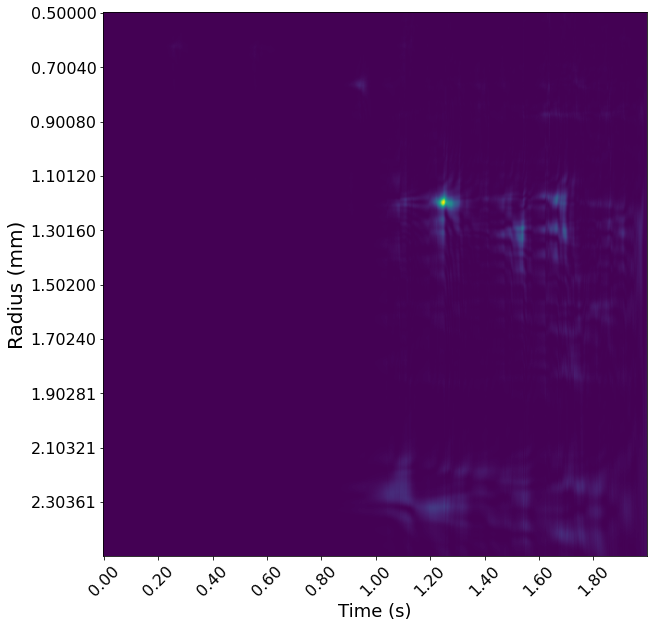

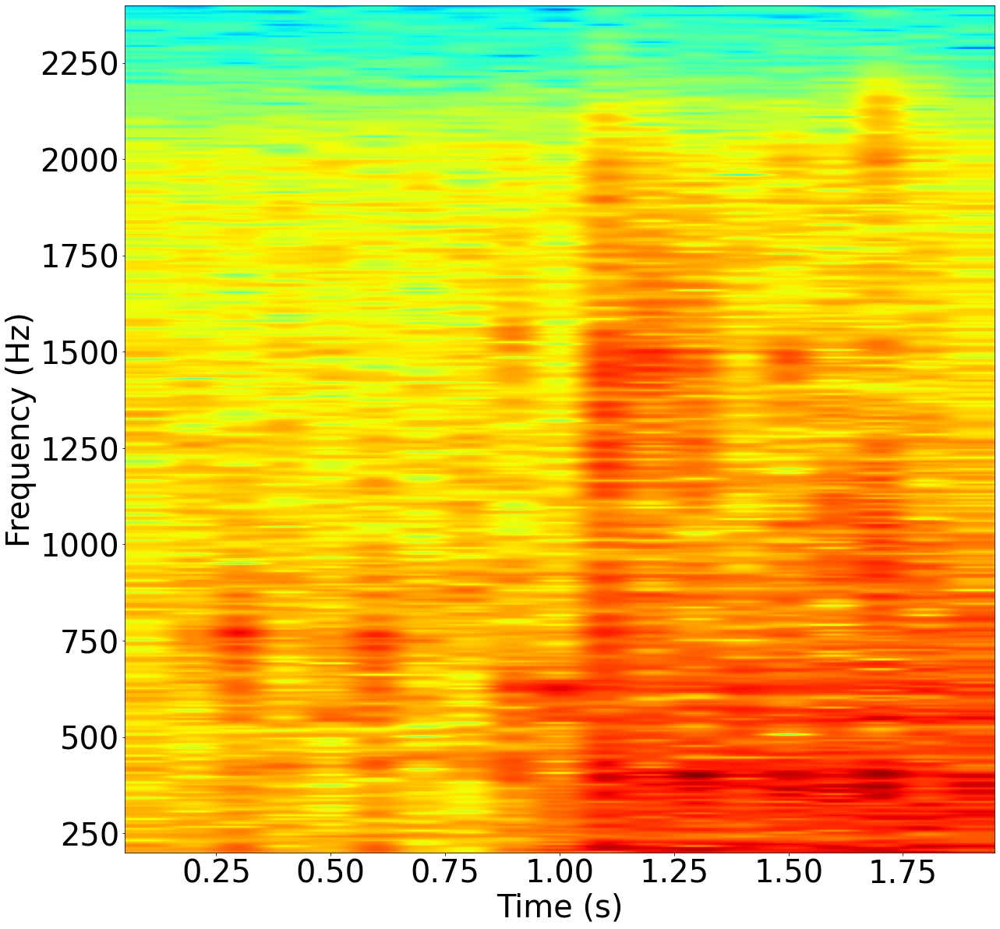

Vazão 10.0, diâmetro 2.5
63.0 seconds of signal, 3024000 points
2 seconds, 96000 points
2.0 seconds of signal, 9600 points


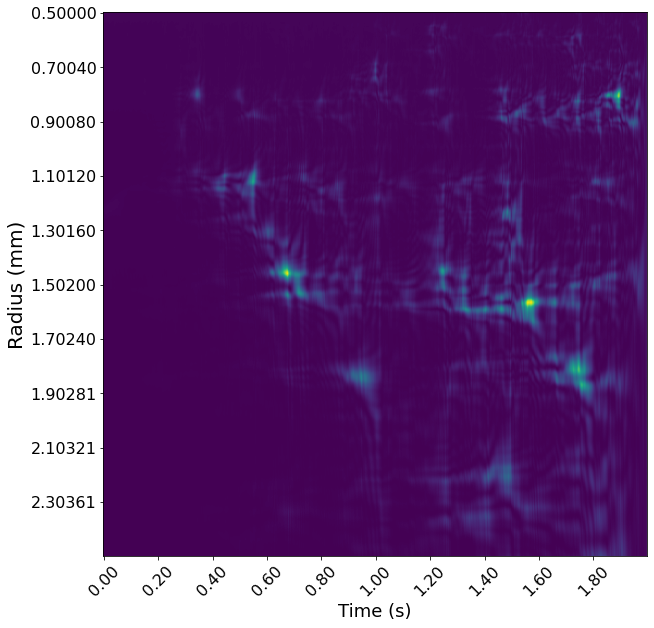

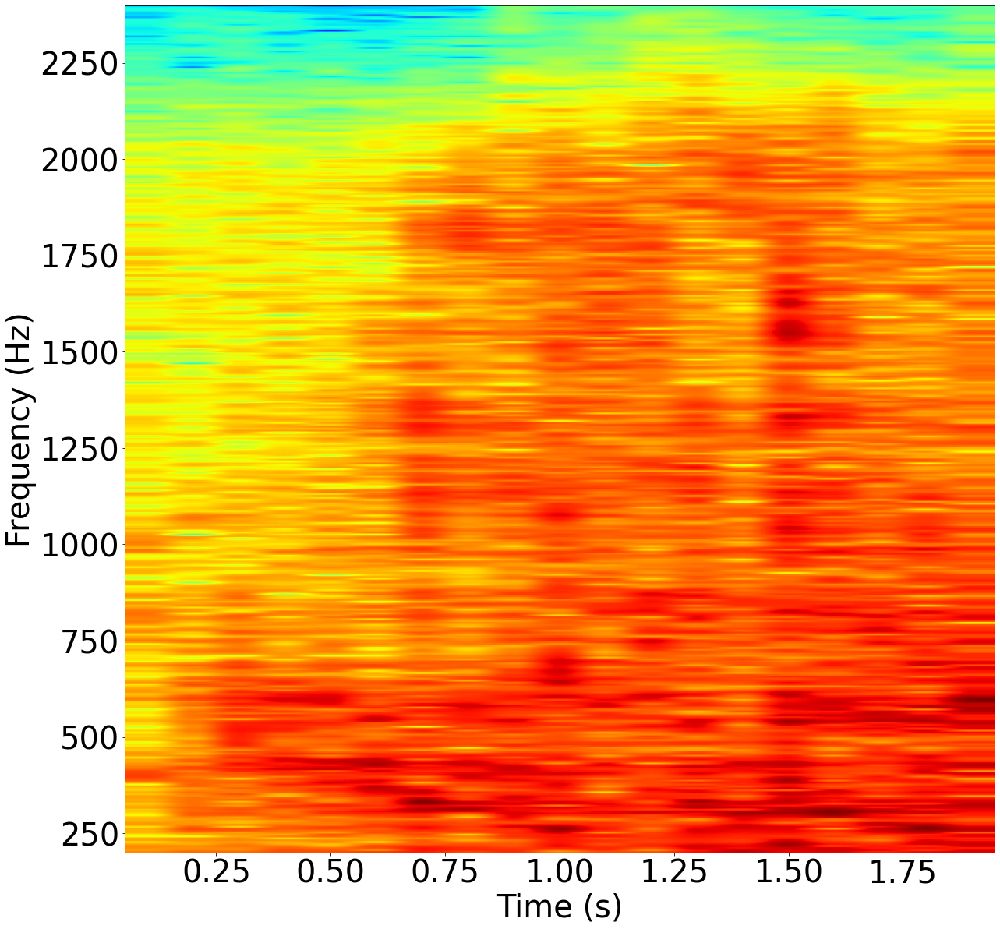

Vazão 10.0, diâmetro 6.0
100.0 seconds of signal, 4800000 points
2 seconds, 96000 points
2.0 seconds of signal, 9600 points


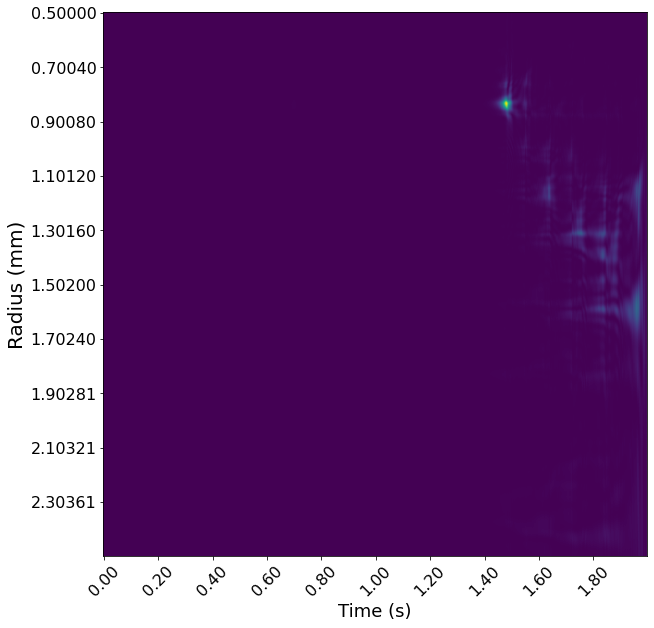

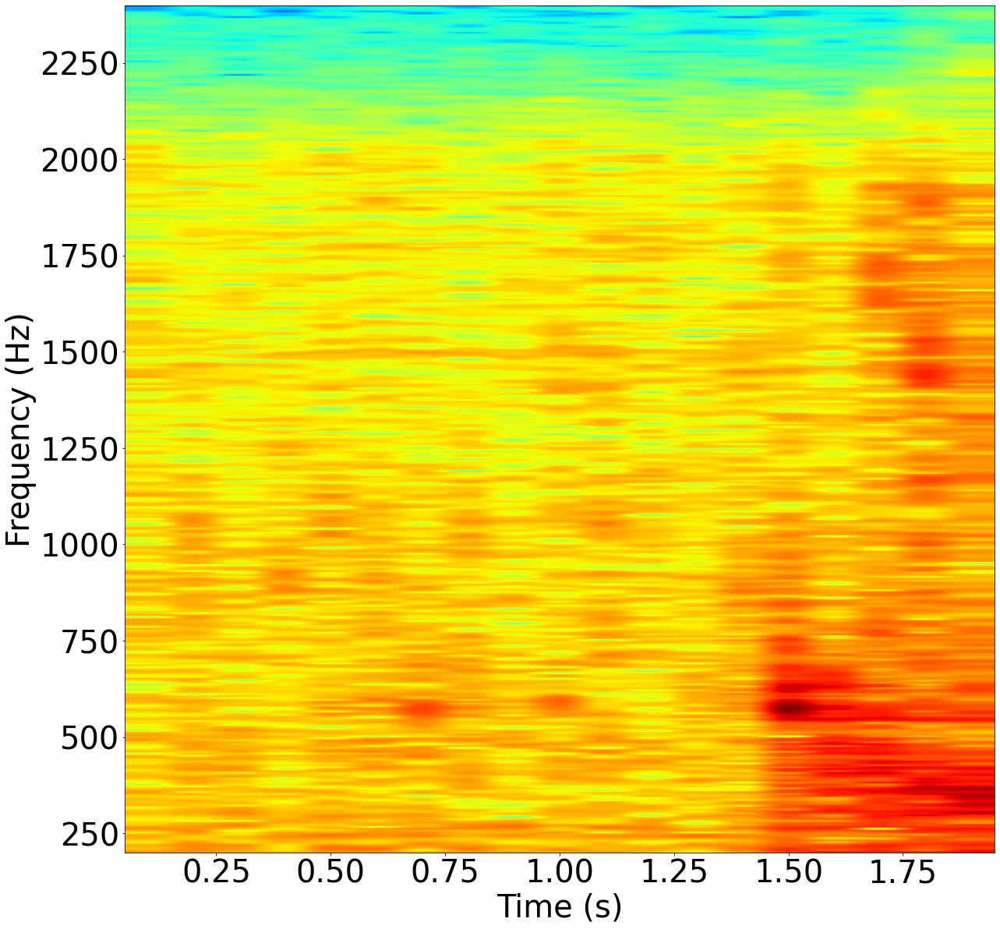

Vazão 10.0, diâmetro 11.0
96.0 seconds of signal, 4608000 points
2 seconds, 96000 points
2.0 seconds of signal, 9600 points


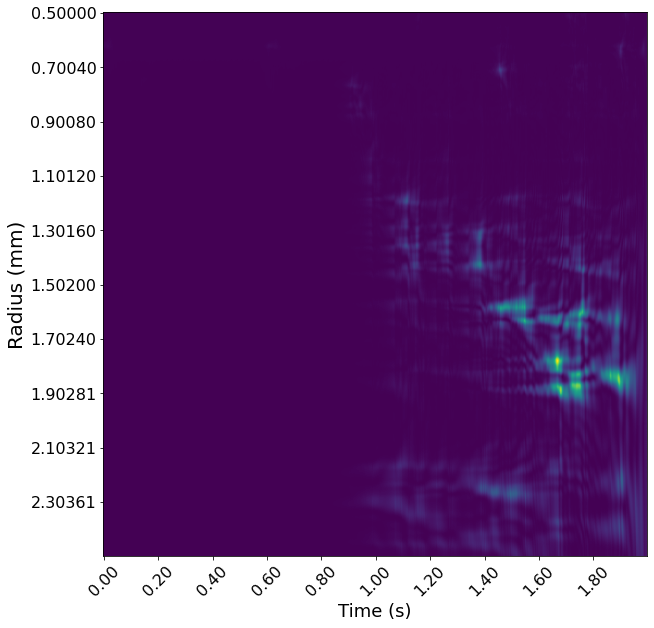

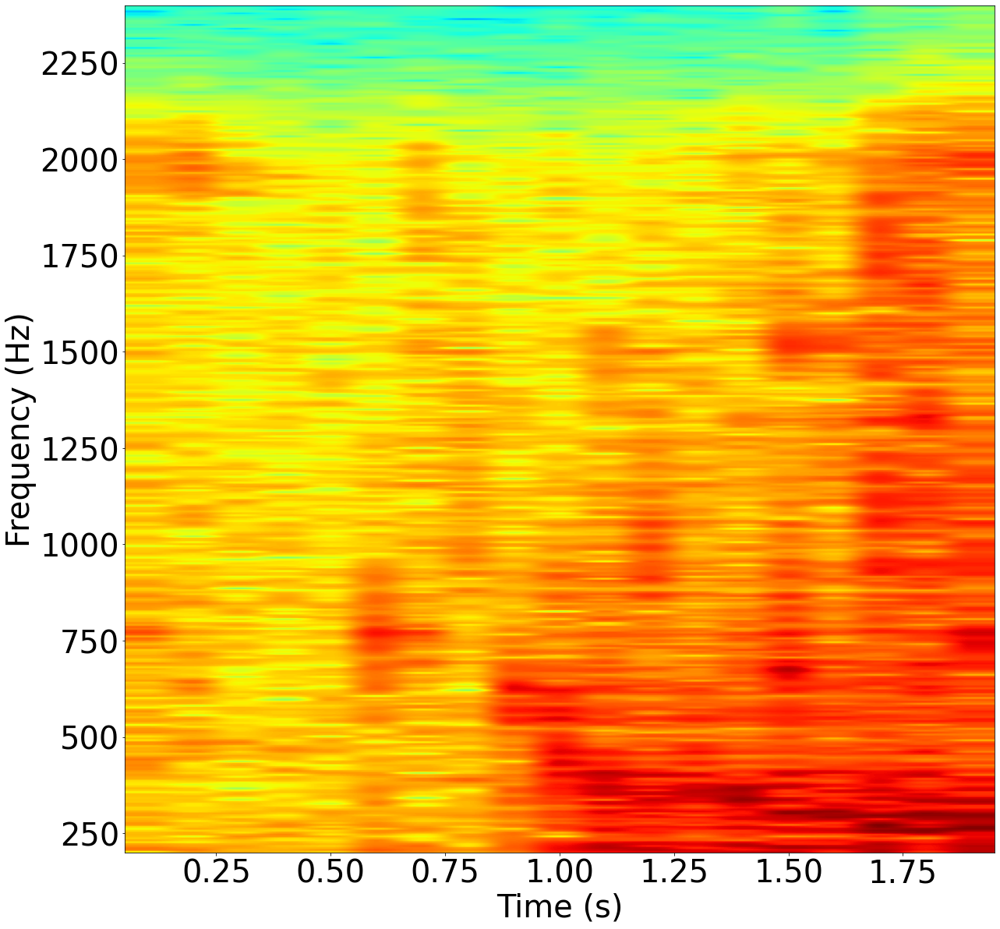

In [1051]:
import scipy.io.wavfile
from scipy.signal import butter, sosfilt, decimate

start_time = 0
end_time = 2

Ms = []
specs = []

N = 20
low_pass = 200
high_pass = 3000
sos = butter(N, [low_pass,high_pass], 'bandpass', fs = 48000, output='sos')

r_min = .5 / 1000
r_max = 2.5 / 1000
n_r = 500
n_t = 500

vazao = '10.0'
diametro= '11.0'

vazoes = ['2.0', '5.0', '10.0']
diametros = ['2.5', '6.0', '11.0']

for vazao in vazoes:
    for diametro in diametros:

        wav = 'data/vazao_' + vazao + '_diametro_' + diametro + '.wav'

        fs, y = scipy.io.wavfile.read(wav)
        y = y / max(y)
        t = np.linspace(0, len(y)/fs, len(y))

        print("Vazão " + vazao + ", diâmetro " + diametro)
        print("{} seconds of signal, {} points".format(len(y)/fs, len(y)))

        yf = sosfilt(sos, y)

        lb = int(start_time*fs)
        ub = int(end_time*fs)

        #sd.play(y[lb:ub], samplerate=fs)
        yb = yf[lb:ub]
        tb = t[lb:ub]
        print("{} seconds, {} points".format(end_time - start_time, len(yb)))

        ypre = yb.copy()
        fspre = fs
        yb = decimate(yb, 10)
        fs = int(fs / 10)
        tb = np.linspace(0, len(yb)/fs, len(yb))

        print("{} seconds of signal, {} points".format(len(yb)/fs, len(yb)))

        o = abubble(yb,tb)


        M, linr = bubblegram(o, r_min, r_max, n_r, n_t)
        lint = np.linspace(o.t_min, o.t_max, n_t)

        Ms.append(M)

        fig = plt.figure(figsize = (20, 10))
        plt.imshow(M)

        ticks_x = np.arange(0, len(lint), step = int(len(lint)/10))
        plt.xticks(ticks_x, ["{:1.2f}".format(d) for d in lint[ticks_x]], rotation = 45, fontsize = 16)
        plt.xlabel("Time (s)", fontsize = 18)

        ticks_y = np.arange(0, len(linr), step = int(len(linr)/10))
        plt.yticks(ticks_y, ["{:1.5f}".format(1000*o) for o in linr[ticks_y]], fontsize = 16)
        plt.ylabel("Radius (mm)", fontsize = 20)

        plt.show()

        res = 5
        m = int(fs / res)

        fig, ax = plt.subplots(1, 1, figsize = (20, 20))
        spec, freq, ts, f = ax.specgram(yb, NFFT=m, Fs=fs, Fc=0, noverlap = int(m/2),
                 cmap=plt.cm.jet, xextent=None, pad_to=None, sides='default',
                 scale_by_freq=None, mode='psd', scale='default', detrend = 'default', window = np.blackman(m))

        specs.append(spec)

        plt.xlabel("Time (s)")
        plt.ylabel("Frequency (Hz)")

        plt.rcParams.update({'font.size' : 40})

        ax.set_ylim([200, fs/2])
        plt.show()

# Obtaining the bubble count

In [1132]:
image = Ms[0].copy()

dens = image.flatten()

In [1150]:
M = image.max()
surf = image - M

surf = np.exp(surf)

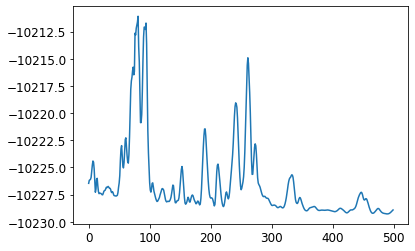

In [1154]:
plt.plot(image[:, 250])

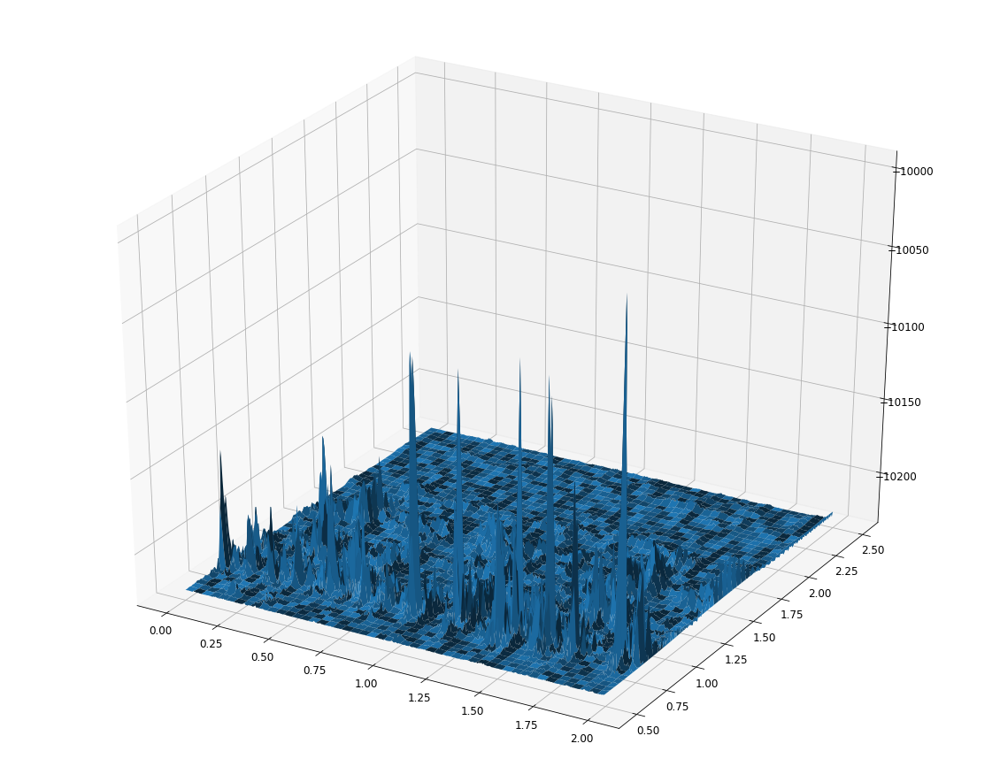

In [1155]:
from mpl_toolkits.mplot3d import Axes3D

plt.rcParams.update({'font.size' : 12})
fig = plt.figure(figsize = (20, 16))
ax = fig.add_subplot(111, projection='3d')


X, Y = np.meshgrid(lint, 1000*linr)
ax.plot_surface(X, Y, image)

Text(0, 0.5, 'Radius (mm)')

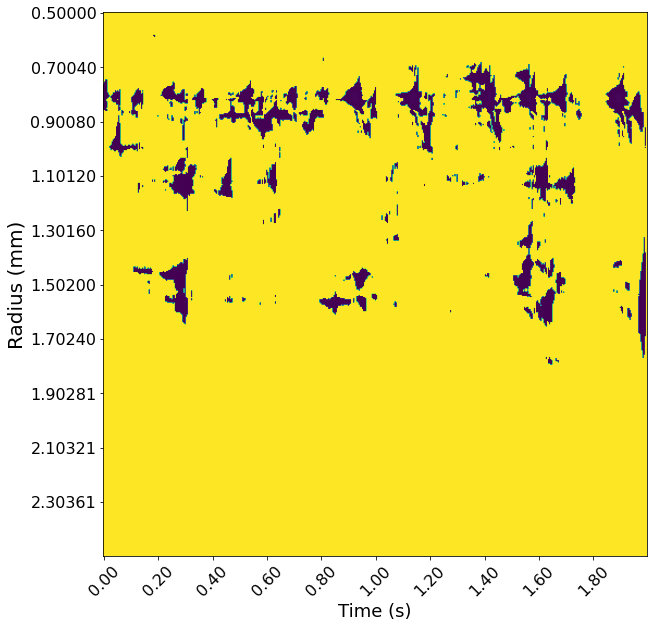

In [1134]:
threshold = np.quantile(dens, .95)

image2 = image.copy()
image2[image2 < threshold] = 0

fig = plt.figure(figsize = (20, 10))
plt.imshow(image2)

ticks_x = np.arange(0, len(lint), step = int(len(lint)/10))
plt.xticks(ticks_x, ["{:1.2f}".format(d) for d in lint[ticks_x]], rotation = 45, fontsize = 16)
plt.xlabel("Time (s)", fontsize = 18)

ticks_y = np.arange(0, len(linr), step = int(len(linr)/10))
plt.yticks(ticks_y, ["{:1.5f}".format(1000*o) for o in linr[ticks_y]], fontsize = 16)
plt.ylabel("Radius (mm)", fontsize = 20)

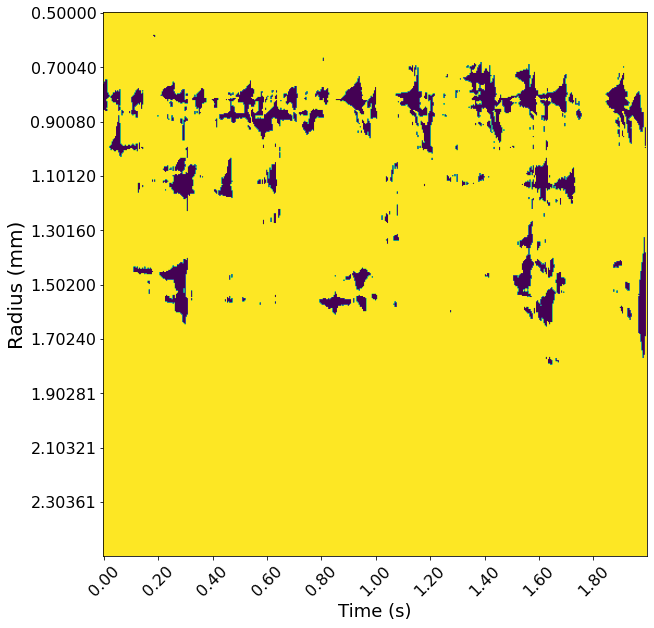

In [1127]:
from scipy.ndimage.filters import maximum_filter
from scipy.ndimage.morphology import generate_binary_structure, binary_erosion

neighborhood = np.ones(shape = (100, 100))#generate_binary_structure(2,1000)
local_max = maximum_filter(image2, footprint = neighborhood)==image2

#we create the mask of the background
#background = (image2==0)

#a little technicality: we must erode the background in order to 
#successfully subtract it form local_max, otherwise a line will 
#appear along the background border (artifact of the local maximum filter)
#eroded_background = binary_erosion(background, structure=neighborhood, border_value=1)

#we obtain the final mask, containing only peaks, 
#by removing the background from the local_max mask (xor operation)
detected_peaks = local_max #^ eroded_background

fig = plt.figure(figsize = (20, 10))
#plt.imshow(image2)

ticks_x = np.arange(0, len(lint), step = int(len(lint)/10))
plt.xticks(ticks_x, ["{:1.2f}".format(d) for d in lint[ticks_x]], rotation = 45, fontsize = 16)
plt.xlabel("Time (s)", fontsize = 18)

ticks_y = np.arange(0, len(linr), step = int(len(linr)/10))
plt.yticks(ticks_y, ["{:1.5f}".format(1000*o) for o in linr[ticks_y]], fontsize = 16)
plt.ylabel("Radius (mm)", fontsize = 20)

plt.imshow(detected_peaks)

plt.show()

# Obtaining the log-posterior density for bubble sizes

In [1295]:
dbubble1 = Ms[0].sum(axis = 1)
dbubble1 = dbubble1 - min(dbubble1)

dbubble2 = Ms[1].sum(axis = 1)
dbubble2 = dbubble2 - min(dbubble2)

dbubble3 = Ms[2].sum(axis = 1)
dbubble3 = dbubble3 - min(dbubble3)

dbubble4 = Ms[3].sum(axis = 1)
dbubble4 = dbubble4 - min(dbubble4)

dbubble5 = Ms[4].sum(axis = 1)
dbubble5 = dbubble5 - min(dbubble5)

dbubble6 = Ms[5].sum(axis = 1)
dbubble6 = dbubble6 - min(dbubble6)

dbubble7 = Ms[6].sum(axis = 1)
dbubble7 = dbubble7 - min(dbubble7)

dbubble8 = Ms[7].sum(axis = 1)
dbubble8 = dbubble8 - min(dbubble8)

dbubble9 = Ms[8].sum(axis = 1)
dbubble9 = dbubble9 - min(dbubble9)

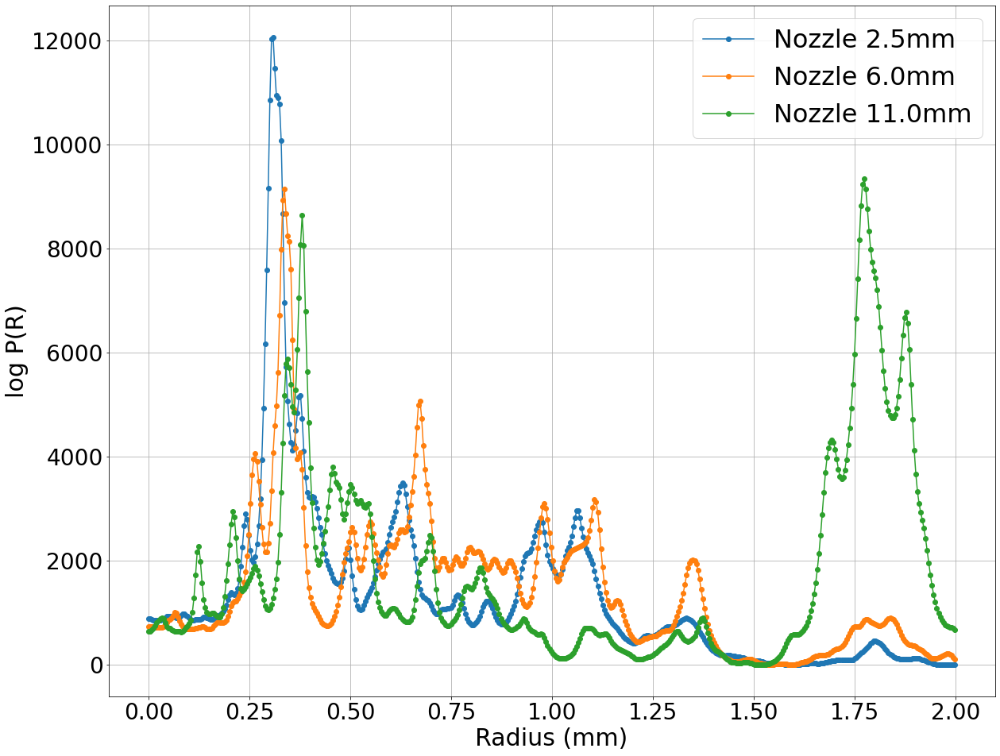

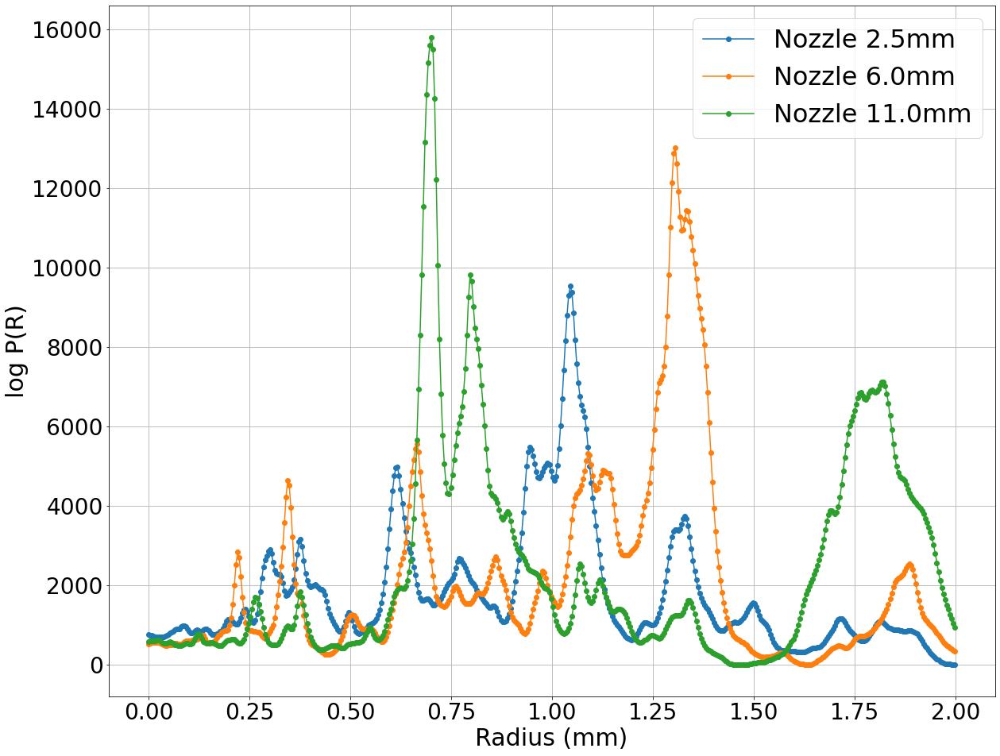

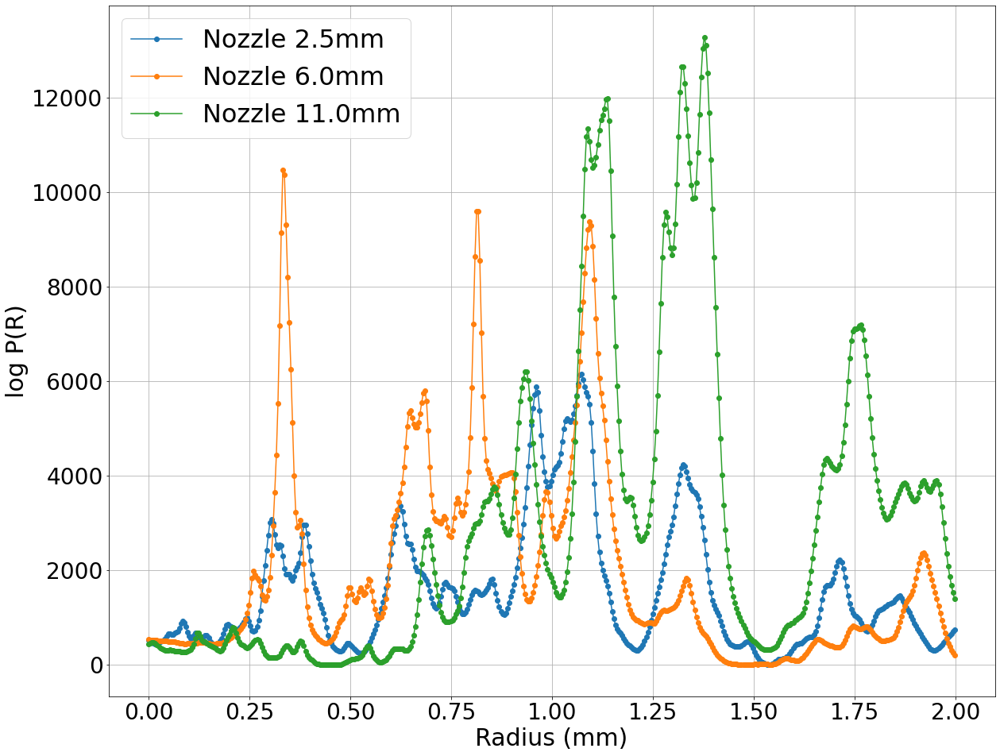

In [1296]:
fig = plt.figure(figsize = (20, 16))

plt.plot(lint, dbubble1, 'o-', label = "Nozzle " + diametros[0] + "mm")
plt.plot(lint2, dbubble2, 'o-', label = "Nozzle " + diametros[1] + "mm")
plt.plot(lint, dbubble3, 'o-', label = "Nozzle " + diametros[2] + "mm")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

fig = plt.figure(figsize = (20, 16))

plt.plot(lint, dbubble4, 'o-', label = "Nozzle " + diametros[0] + "mm")
plt.plot(lint2, dbubble5, 'o-', label = "Nozzle " + diametros[1] + "mm")
plt.plot(lint, dbubble6, 'o-', label = "Nozzle " + diametros[2] + "mm")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

fig = plt.figure(figsize = (20, 16))

plt.plot(lint, dbubble7, 'o-', label = "Nozzle " + diametros[0] + "mm")
plt.plot(lint2, dbubble8, 'o-', label = "Nozzle " + diametros[1] + "mm")
plt.plot(lint, dbubble9, 'o-', label = "Nozzle " + diametros[2] + "mm")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

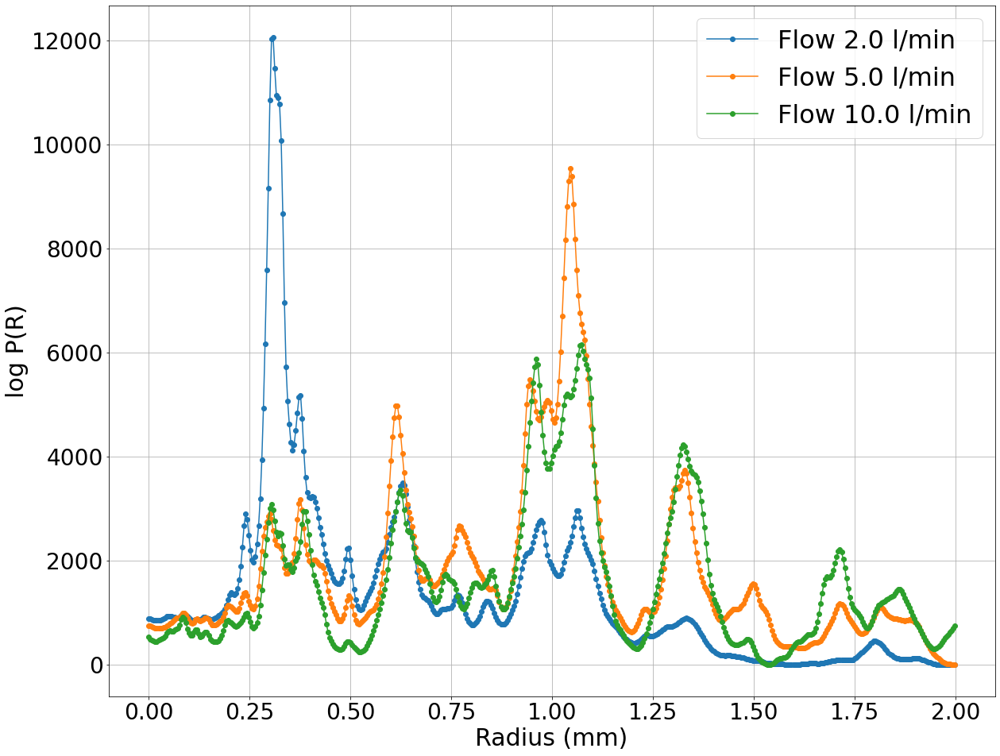

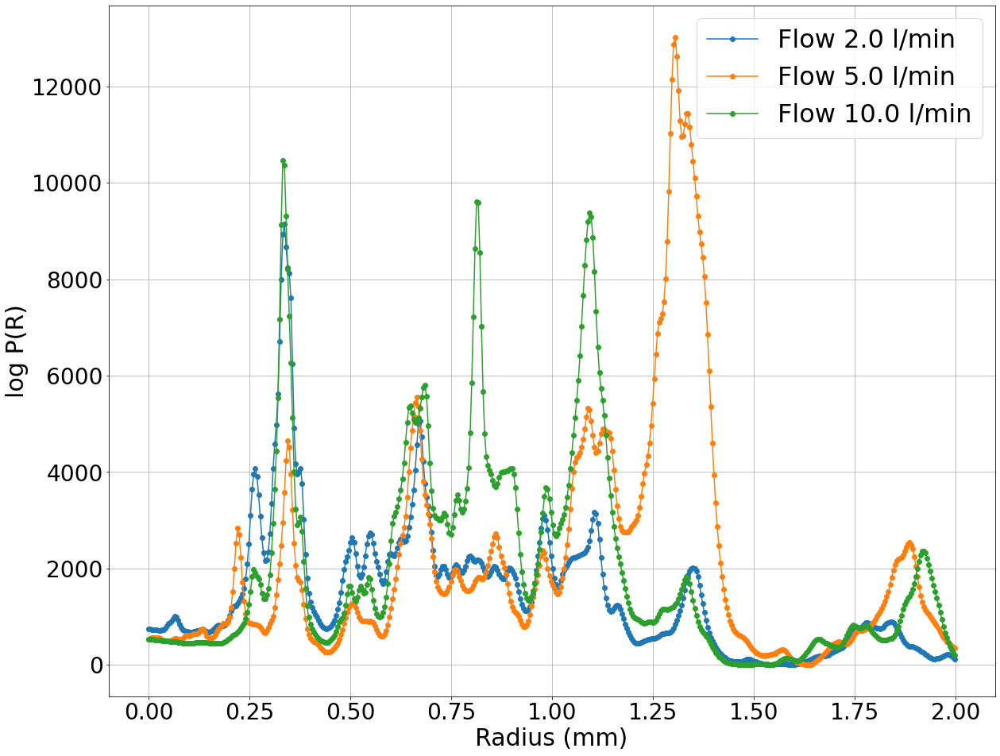

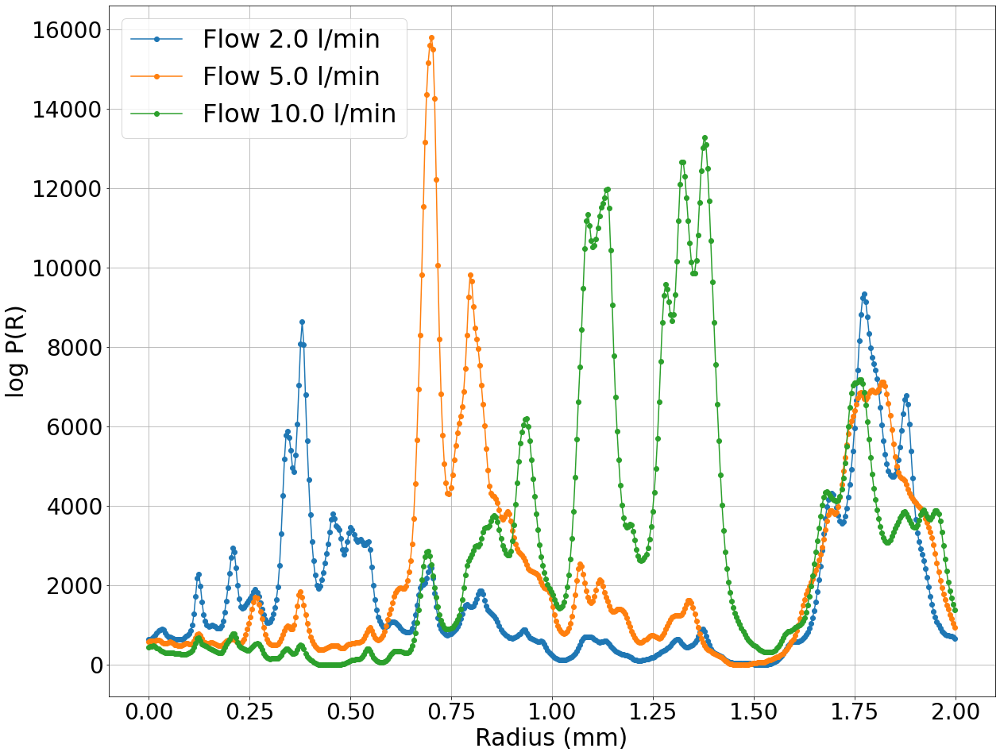

In [1297]:
fig = plt.figure(figsize = (20, 16))

plt.plot(lint, dbubble1, 'o-', label = "Flow " + vazoes[0] + " l/min")
plt.plot(lint2, dbubble4, 'o-', label = "Flow " + vazoes[1] + " l/min")
plt.plot(lint, dbubble7, 'o-', label = "Flow " + vazoes[2] +  " l/min")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

fig = plt.figure(figsize = (20, 16))

plt.plot(lint, dbubble2, 'o-', label = "Flow " + vazoes[0] + " l/min")
plt.plot(lint2, dbubble5, 'o-', label = "Flow " + vazoes[1] + " l/min")
plt.plot(lint, dbubble8, 'o-', label = "Flow " + vazoes[2] + " l/min")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

fig = plt.figure(figsize = (20, 16))

plt.plot(lint, dbubble3, 'o-', label = "Flow " + vazoes[0] + " l/min")
plt.plot(lint2, dbubble6, 'o-', label = "Flow " + vazoes[1] + " l/min")
plt.plot(lint, dbubble9, 'o-', label = "Flow " + vazoes[2] + " l/min")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

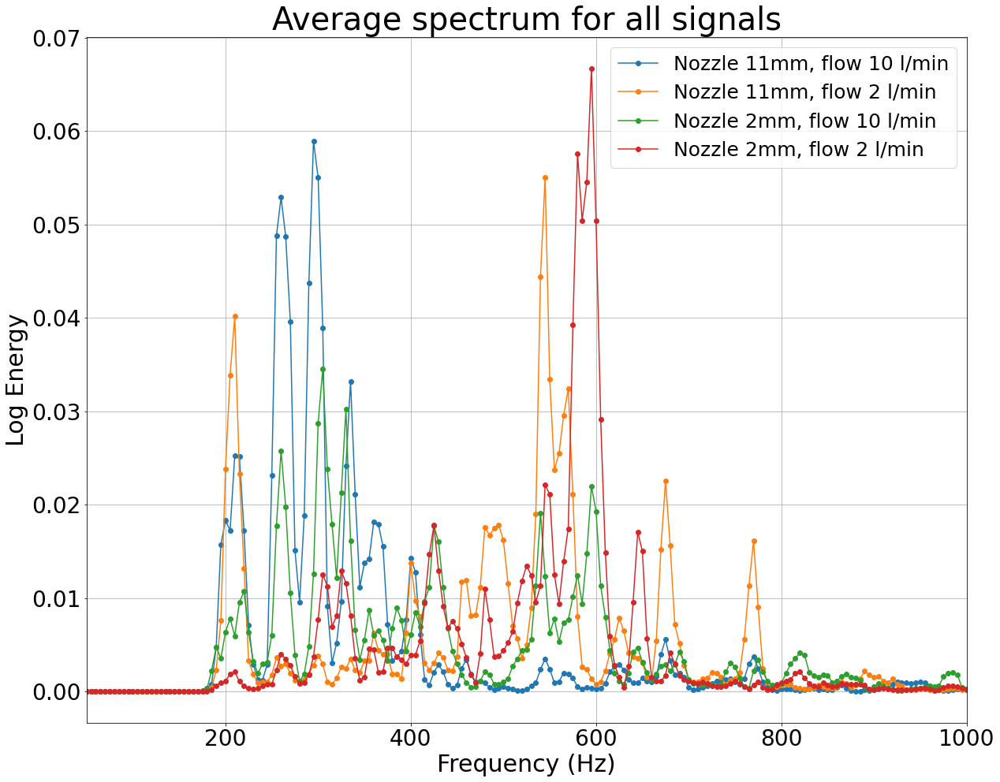

In [1044]:
db1 = spec1.sum(axis = 1)
db1 = db1 / sum(db1)
db2 = spec2.sum(axis = 1)
db2 = db2 / sum(db2)
db3 = spec3.sum(axis = 1)
db3 = db3 / sum(db3)
db4 = spec4.sum(axis = 1)
db4 = db4 / sum(db4)

fig = plt.figure(figsize = (20, 16))

plt.plot(freq, db1,  'o-', label = "Nozzle 11mm, flow 10 l/min")
plt.plot(freq, db2, 'o-', label = "Nozzle 11mm, flow 2 l/min")
plt.plot(freq, db3, 'o-', label = "Nozzle 2mm, flow 10 l/min")
plt.plot(freq, db4, 'o-', label = "Nozzle 2mm, flow 2 l/min")

plt.xlabel('Frequency (Hz)', fontsize = 30)
plt.ylabel('Log Energy', fontsize = 30)
plt.title('Average spectrum for all signals', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 25, loc = 'upper right')


plt.xlim((50,1000))
plt.grid(True)

plt.show()

# Smoothing the marginal log-posterior

In [1298]:
one_every = 10
q = .000001

sbubble1 = dbubble1.copy()
#sbubble1[sbubble1 <= np.quantile(sbubble1, q)] = 0
sbubble1 = sbubble1[0::one_every]
sbubble1 = sbubble1 / sum(sbubble1)

sbubble2 = dbubble2.copy()
#sbubble2[sbubble2 <= np.quantile(sbubble2, q)] = 0
sbubble2 = sbubble2[0::one_every]
sbubble2 = sbubble2 / sum(sbubble2)

sbubble3 = dbubble3.copy()
#sbubble3[sbubble3 <= np.quantile(sbubble3, q)] = 0
sbubble3 = sbubble3[0::one_every]
sbubble3 = sbubble3 / sum(sbubble3)

sbubble4 = dbubble4.copy()
sbubble4[sbubble4 <= np.quantile(sbubble4, q)] = 0
sbubble4 = sbubble4[0::one_every]
sbubble4 = sbubble4 / sum(sbubble4)

sbubble5 = dbubble5.copy()
sbubble5[sbubble5 <= np.quantile(sbubble5, q)] = 0
sbubble5 = sbubble5[0::one_every]
sbubble5 = sbubble5 / sum(sbubble5)

sbubble6 = dbubble6.copy()
sbubble6[sbubble6 <= np.quantile(sbubble6, q)] = 0
sbubble6 = sbubble6[0::one_every]
sbubble6 = sbubble6 / sum(sbubble6)

sbubble7 = dbubble7.copy()
sbubble7[sbubble7 <= np.quantile(sbubble7, q)] = 0
sbubble7 = sbubble7[0::one_every]
sbubble7 = sbubble7 / sum(sbubble7)

sbubble8 = dbubble8.copy()
sbubble8[sbubble8 <= np.quantile(sbubble8, q)] = 0
sbubble8 = sbubble8[0::one_every]
sbubble8 = sbubble8 / sum(sbubble8)

sbubble9 = dbubble9.copy()
sbubble9[sbubble9 <= np.quantile(sbubble9, q)] = 0
sbubble9 = sbubble9[0::one_every]
sbubble9 = sbubble9 / sum(sbubble9)

sint = lint[0::one_every]

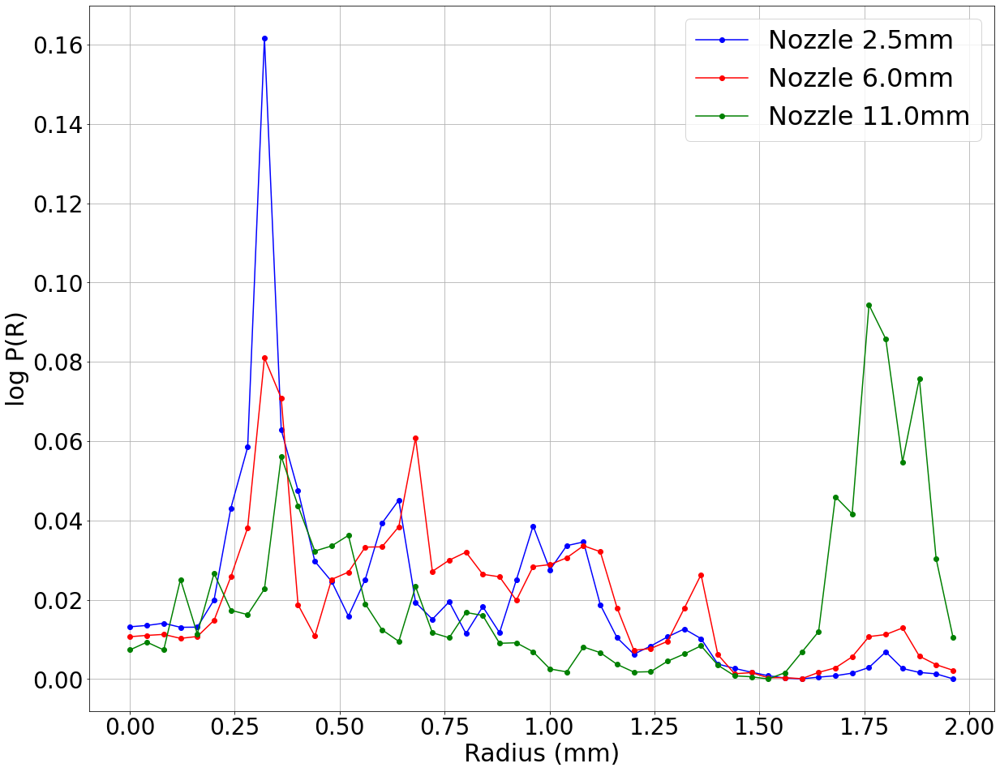

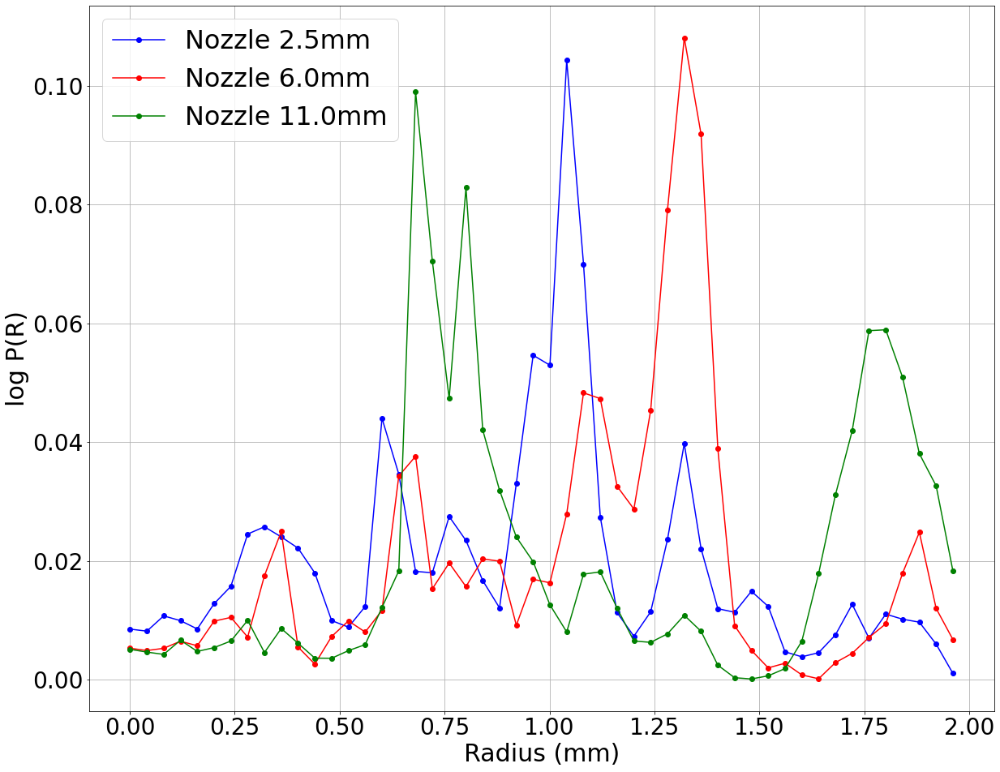

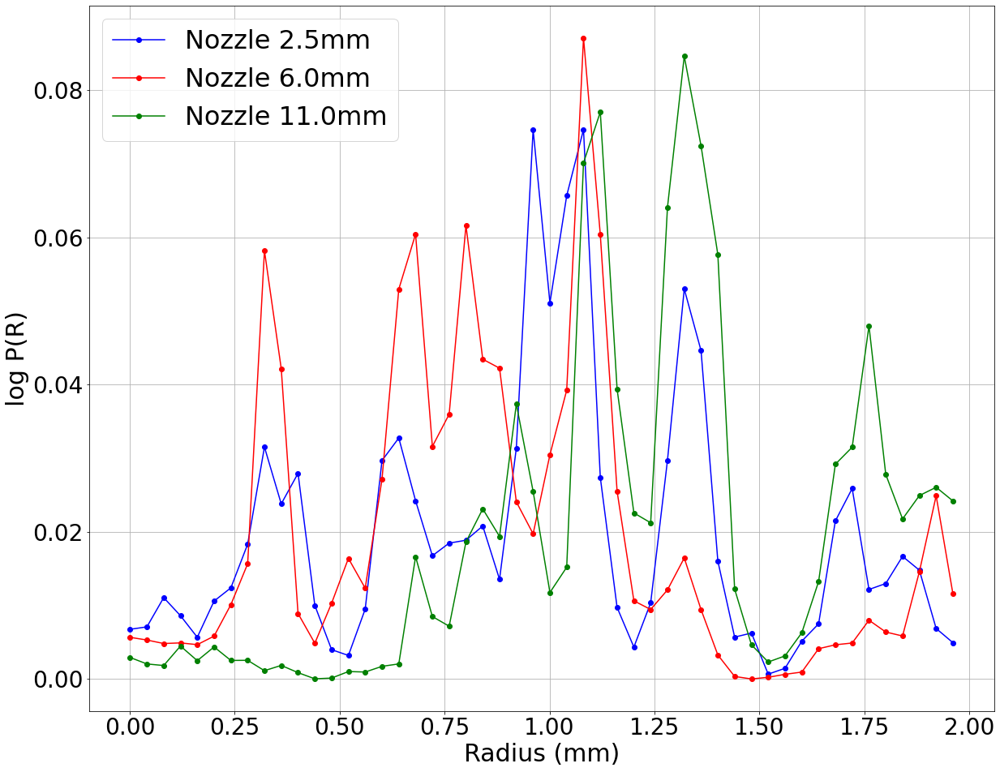

In [1299]:
fig = plt.figure(figsize = (20, 16))

plt.plot(sint, sbubble1, 'o-', label = "Nozzle " + diametros[0] + "mm", color = "blue")
plt.plot(sint, sbubble2, 'o-', label = "Nozzle " + diametros[1] + "mm", color = "red")
plt.plot(sint, sbubble3, 'o-', label = "Nozzle " + diametros[2] + "mm", color = "green")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

fig = plt.figure(figsize = (20, 16))

plt.plot(sint, sbubble4, 'o-', label = "Nozzle " + diametros[0] + "mm", color = "blue")
plt.plot(sint, sbubble5, 'o-', label = "Nozzle " + diametros[1] + "mm", color = "red")
plt.plot(sint, sbubble6, 'o-', label = "Nozzle " + diametros[2] + "mm", color = "green")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

fig = plt.figure(figsize = (20, 16))

plt.plot(sint, sbubble7, 'o-', label = "Nozzle " + diametros[0] + "mm", color = "blue")
plt.plot(sint, sbubble8, 'o-', label = "Nozzle " + diametros[1] + "mm", color = "red")
plt.plot(sint, sbubble9, 'o-', label = "Nozzle " + diametros[2] + "mm", color = "green")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

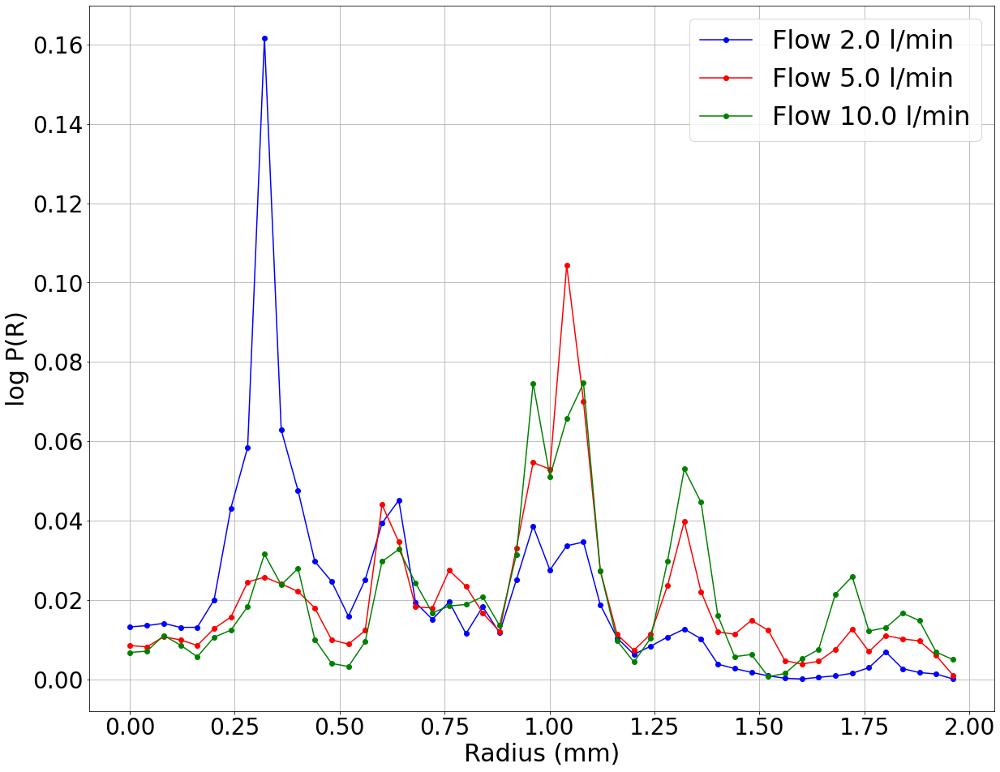

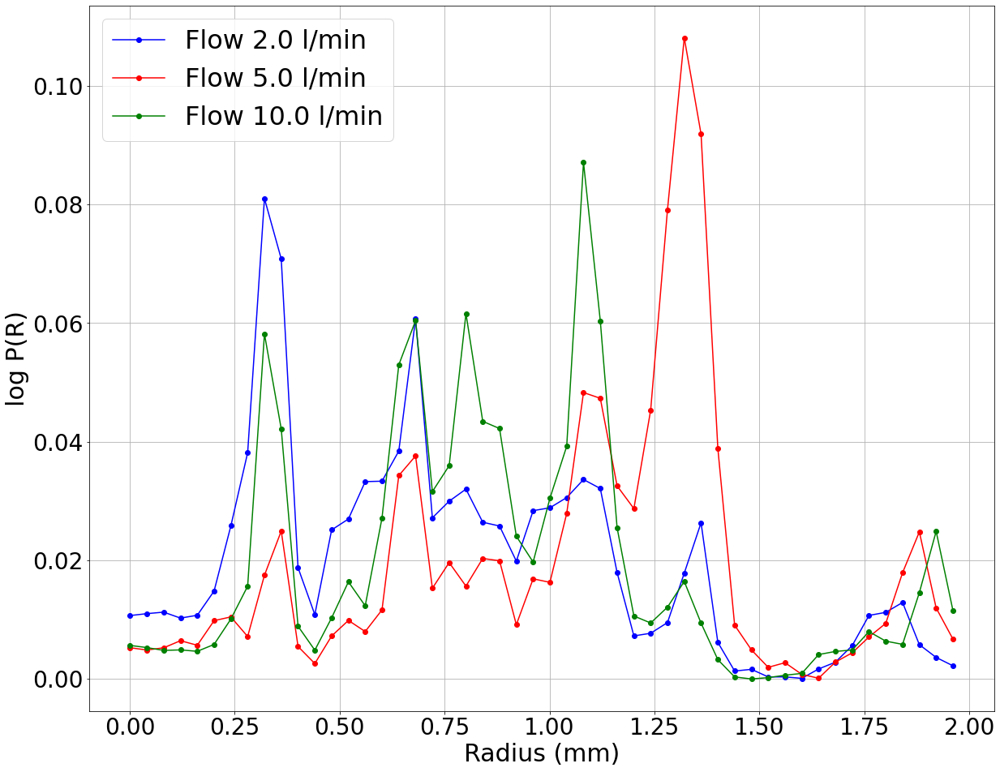

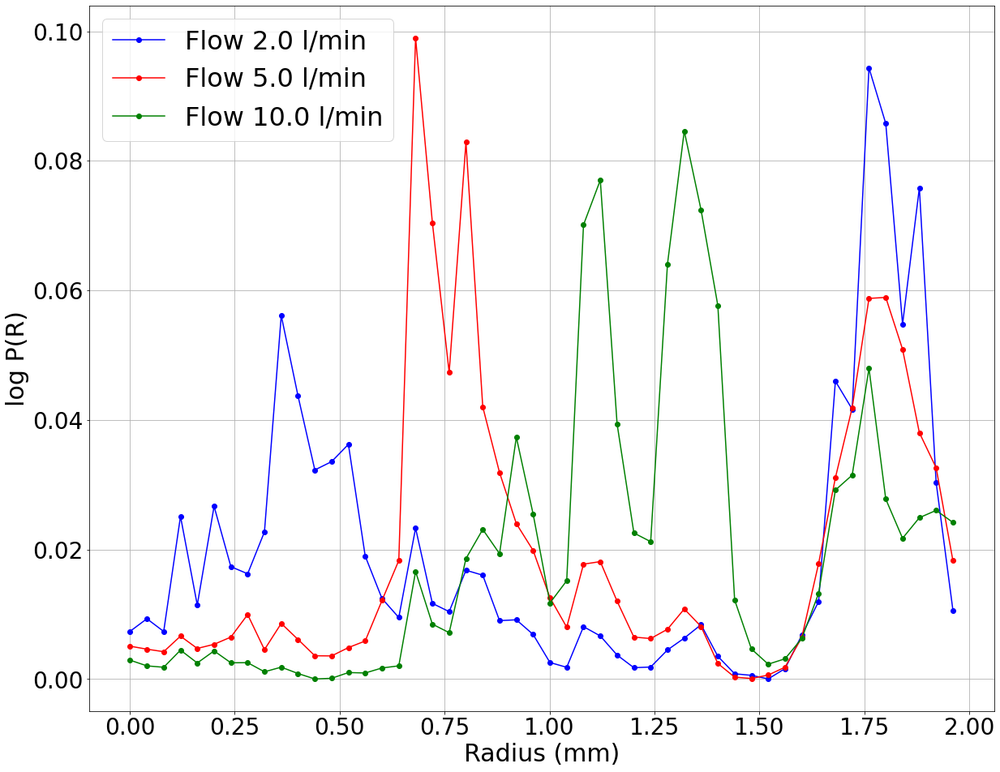

In [1300]:
fig = plt.figure(figsize = (20, 16))

plt.plot(sint, sbubble1, 'o-', label = "Flow " + vazoes[0] + " l/min", color = "blue")
plt.plot(sint, sbubble4, 'o-', label = "Flow " + vazoes[1] + " l/min", color = "red")
plt.plot(sint, sbubble7, 'o-', label = "Flow " + vazoes[2] +  " l/min", color = "green")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

fig = plt.figure(figsize = (20, 16))

plt.plot(sint, sbubble2, 'o-', label = "Flow " + vazoes[0] + " l/min", color = "blue")
plt.plot(sint, sbubble5, 'o-', label = "Flow " + vazoes[1] + " l/min", color = "red")
plt.plot(sint, sbubble8, 'o-', label = "Flow " + vazoes[2] + " l/min", color = "green")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

fig = plt.figure(figsize = (20, 16))

plt.plot(sint, sbubble3, 'o-', label = "Flow " + vazoes[0] + " l/min", color = "blue")
plt.plot(sint, sbubble6, 'o-', label = "Flow " + vazoes[1] + " l/min", color = "red")
plt.plot(sint, sbubble9, 'o-', label = "Flow " + vazoes[2] + " l/min", color = "green")

plt.xlabel('Radius (mm)', fontsize = 30)
plt.ylabel('log P(R)', fontsize = 30)
#plt.title('Log-posterior for bubble sizes', fontsize = 40)
plt.xticks(fontsize = 28)
plt.yticks(fontsize = 28)
plt.legend(fontsize = 32)

plt.grid(True)

plt.show()

In [1184]:
# Reading the signal
vazao = vazoes[0]
diametro = diametros[0]

wav = 'data/vazao_' + vazao + '_diametro_' + diametro + '.wav'

fs, y = scipy.io.wavfile.read(wav)
y = y / max(y)
t = np.linspace(0, len(y)/fs, len(y))

print("Vazão " + vazao + ", diâmetro " + diametro)
print("{} seconds of signal, {} points".format(len(y)/fs, len(y)))

# Bandpass filter
yf = sosfilt(sos, y)

lb = int(start_time*fs)
ub = int(end_time*fs)

yb = yf[lb:ub]
tb = t[lb:ub]
print("{} seconds, {} points".format(end_time - start_time, len(yb)))

# Decimating
ypre = yb.copy()
fspre = fs
yb = decimate(yb, 10)
fs = int(fs / 10)
tb = np.linspace(0, len(yb)/fs, len(yb))

print("{} seconds of signal, {} points".format(len(yb)/fs, len(yb)))

# Creating object for analysis
o = abubble(yb,tb)

Vazão 2.0, diâmetro 2.5
107.0 seconds of signal, 5136000 points
2 seconds, 96000 points
2.0 seconds of signal, 9600 points


In [1222]:
# Sampling from the log posterior

def bubble_logp(r, t0):
    return o.llhood(r, t0)

def mcmc(ndraw, nburn, rs, ts):
    
    rsample = np.zeros(shape = (ndraw))
    tsample = np.zeros(shape = (ndraw))
    
    rcur = np.random.uniform(low = rs[0], high = rs[1])
    tcur = np.random.uniform(low = ts[0], high = ts[1])
    
    pcur = bubble_logp(rcur, tcur)
    acc = 0
    for i in range(ndraw):
        
        r = rcur + np.random.normal(0, 1e-5)
        while r <= 0:
            r = rcur + np.random.normal(0, 1e-4)

        p = bubble_logp(r, tcur)
        
        if p > pcur:
            rcur = r
            pcur = p
            acc = acc + 1
        else:
            pacc = np.exp(p-pcur)
            u = np.random.uniform(0, 1)
            if u < pacc:
                rcur = r
                pcur = p
                acc = acc + 1
            
        t = np.random.uniform(ts[0], ts[1])
        
        p = bubble_logp(rcur, t)
        
        if p > pcur:
            tcur = t
            pcur = p
            acc = acc + 1
        else:
            pacc = np.exp(p-pcur)
            u = np.random.uniform(0, 1)
            if u < pacc:
                tcur = t
                pcur = p
                acc = acc + 1
        
        rsample[i] = rcur
        tsample[i] = tcur
            
    return rsample[nburn:], tsample[nburn:], acc

In [1229]:
%%time
ndraw = 10000
nburn = 5000
nchains = 4

from joblib import Parallel, delayed
from itertools import product

chains = Parallel(n_jobs=-1)(delayed(mcmc)(ndraw, nburn,[r_min, r_max], [0., 2.]) for i in range(nchains))

#rsample, tsample, acc = mcmc(ndraw, nburn, [r_min, r_max], [0, 2.])

CPU times: user 119 ms, sys: 226 ms, total: 345 ms
Wall time: 37.4 s


In [1233]:
acc = sum([c[2] for c in chains]) / nchains
print("Average acceptance rate = {:.2%}".format(acc / (2*ndraw)))

Average acceptance rate = 19.50%


(array([6.22284719, 0.30527877, 0.03350621, 0.09121134, 0.11541027,
        0.52493057, 1.26206712, 0.25688092, 0.22337471, 0.27177257]),
 array([1.55677116, 1.66421394, 1.77165672, 1.8790995 , 1.98654228,
        2.09398506, 2.20142784, 2.30887062, 2.4163134 , 2.52375618,
        2.63119896]),
 <a list of 10 Patch objects>)

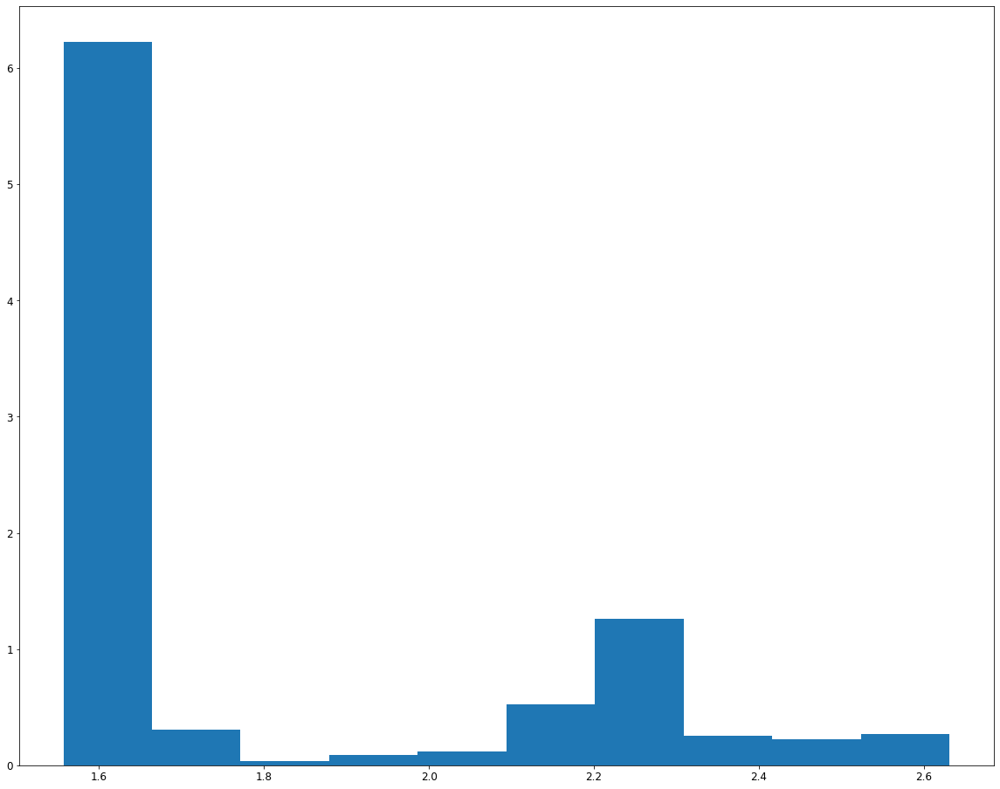

In [1235]:
fig = plt.figure(figsize = (20,16))
plt.hist(rsample*1000, density = True)

(array([3.71705205, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.02461624, 0.        , 2.11934094]),
 array([0.29269423, 0.46331331, 0.63393239, 0.80455147, 0.97517055,
        1.14578963, 1.31640871, 1.48702779, 1.65764687, 1.82826595,
        1.99888503]),
 <a list of 10 Patch objects>)

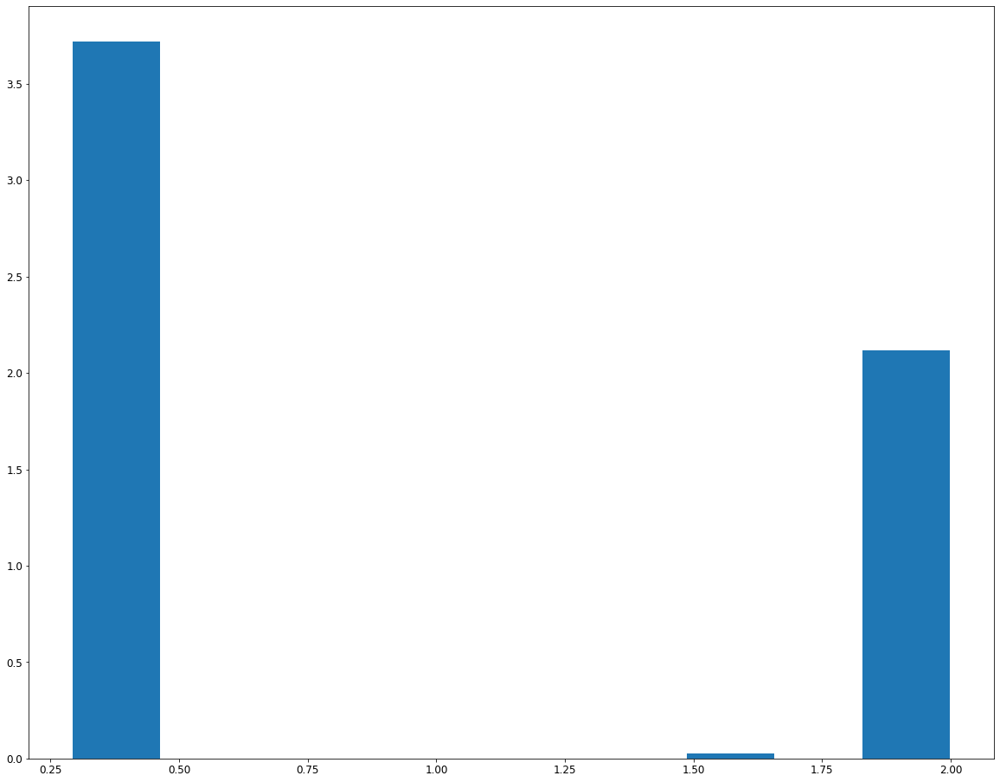

In [1236]:
fig = plt.figure(figsize = (20,16))
plt.hist(tsample, density = True)